# COSMOS: Validation Checks (FULL)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools


In [22]:
catname = "../../dmu1/dmu1_ml_COSMOS/data/master_catalogue_cosmos_20180313.fits"
master_catalogue = Table.read(catname)

print("Number of sources in master catalogue: ", len(master_catalogue))

Number of sources in master catalogue:  2572347


In [23]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

COSMOS


In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [27]:
u_bands = ["Megacam u",                      "KIDS u"]
g_bands = ["Megacam g", "DECam g", "GPC1 g", "KIDS g", "SUPRIME g"]
r_bands = ["Megacam r", "DECam r", "GPC1 r", "KIDS r", "SUPRIME r"]
i_bands = ["Megacam i",            "GPC1 i", "KIDS i", "SUPRIME i"]
z_bands = ["Megacam z", "DECam z", "GPC1 z",           "SUPRIME z"]
y_bands = [                        "GPC1 y",           "SUPRIME y", "UKIDSS Y"]
J_bands = [                                                         "UKIDSS J", "WIRCAM J"]
H_bands = [                                                         "UKIDSS H", "WIRCAM H"]
K_bands = [                                                         "UKIDSS K", "WIRCAM Ks"]

all_bands = [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, J_bands, H_bands, K_bands]

irac_bands = []

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands
ir_mags = J_bands + H_bands + K_bands + irac_bands

#other_bands = ["CANDELS F140W", "CANDELS F160W", "CANDELS F125W", "CANDELS F606W", "CANDELS F814W",
#               "SUPRIME N921"]
other_bands = []

all_mags = opt_mags + ir_mags + other_bands

In [28]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

Megacam u mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 548, min mag = 31.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam u mag (total)
    Error max: 89
    magerr > 10: Number of objects = 453, min mag = 29.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



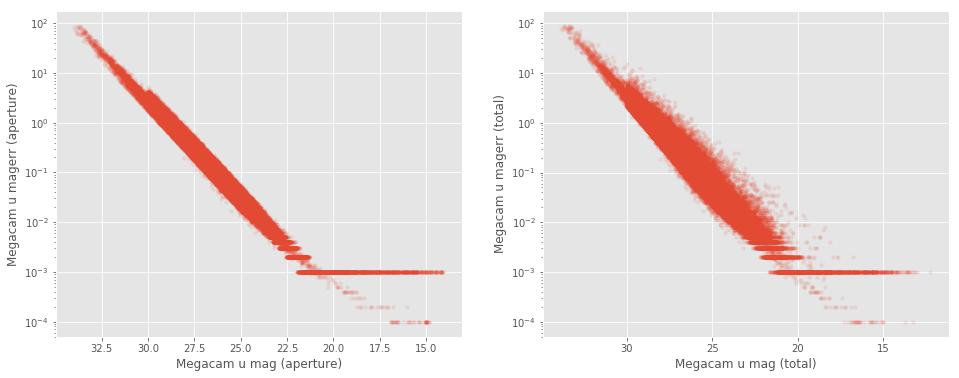

KIDS u mag (aperture)
    Error max: 96748
    magerr > 10: Number of objects = 1095, min mag = 27.4
    magerr > 100: Number of objects = 113, min mag = 30.3
    magerr > 1000: Number of objects = 13, min mag = 33.3

KIDS u mag (total)
    Error max: 186809
    magerr > 10: Number of objects = 1920, min mag = 25.2
    magerr > 100: Number of objects = 178, min mag = 29.6
    magerr > 1000: Number of objects = 15, min mag = 33.1



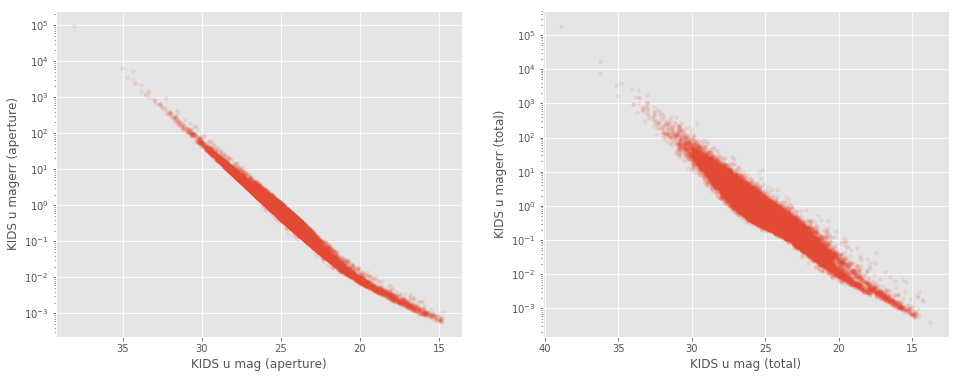

Megacam g mag (aperture)
    Error max: 84
    magerr > 10: Number of objects = 242, min mag = 29.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam g mag (total)
    Error max: 83
    magerr > 10: Number of objects = 203, min mag = 29.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



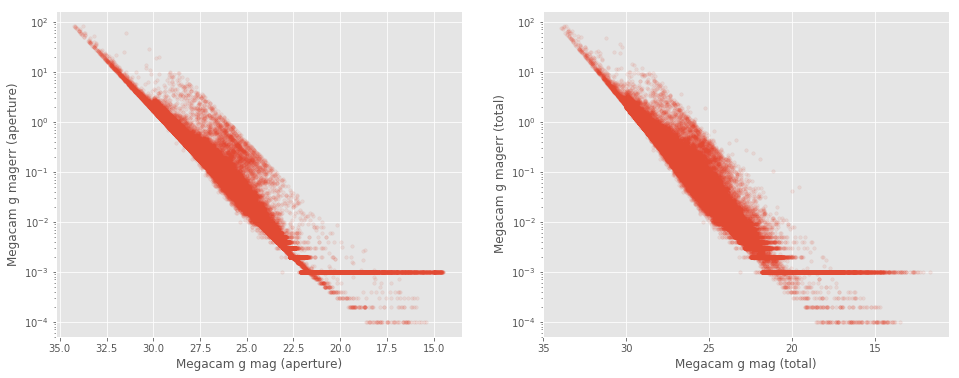

DECam g mag (aperture)
    Error max: 52242
    magerr > 10: Number of objects = 2567, min mag = 26.4
    magerr > 100: Number of objects = 247, min mag = 29.0
    magerr > 1000: Number of objects = 23, min mag = 32.7

DECam g mag (total)
    Error max: 24043
    magerr > 10: Number of objects = 1879, min mag = 9.7
    magerr > 100: Number of objects = 173, min mag = 26.3
    magerr > 1000: Number of objects = 22, min mag = 32.9



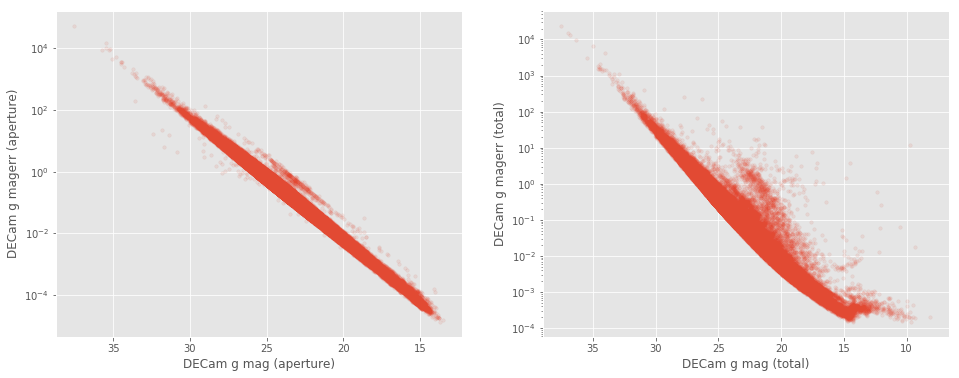

GPC1 g mag (aperture)
    Error max: 9589
    magerr > 10: Number of objects = 582, min mag = 24.7
    magerr > 100: Number of objects = 44, min mag = 28.2
    magerr > 1000: Number of objects = 6, min mag = 32.3

GPC1 g mag (total)
    Error max: 134663
    magerr > 10: Number of objects = 631, min mag = 24.0
    magerr > 100: Number of objects = 67, min mag = 26.6
    magerr > 1000: Number of objects = 3, min mag = 30.4



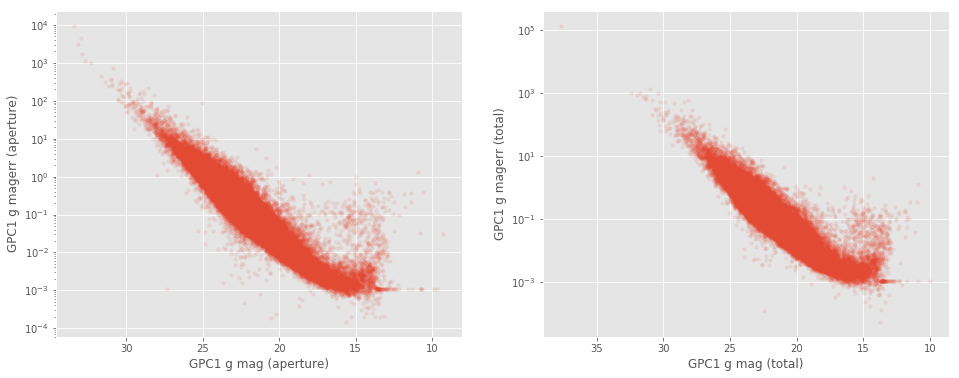

KIDS g mag (aperture)
    Error max: 8014
    magerr > 10: Number of objects = 477, min mag = 28.0
    magerr > 100: Number of objects = 48, min mag = 31.1
    magerr > 1000: Number of objects = 3, min mag = 34.2

KIDS g mag (total)
    Error max: 2742
    magerr > 10: Number of objects = 780, min mag = 27.8
    magerr > 100: Number of objects = 83, min mag = 30.6
    magerr > 1000: Number of objects = 6, min mag = 34.0



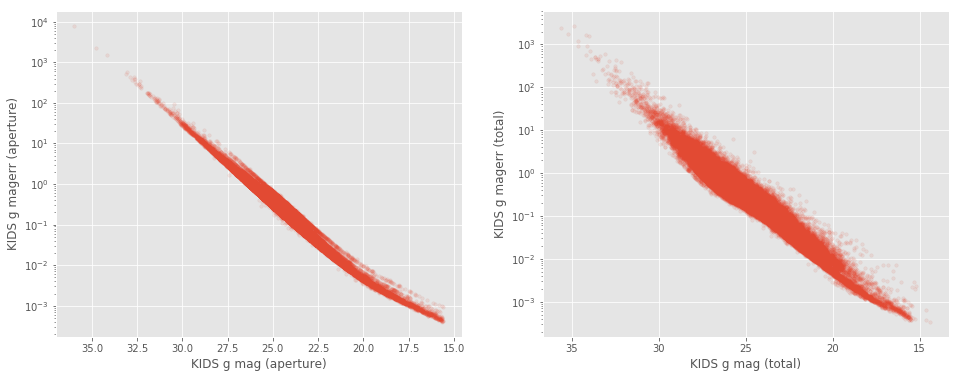

SUPRIME g mag (aperture)
    Error max: 5357749437202432
    magerr > 10: Number of objects = 39537, min mag = 29.2
    magerr > 100: Number of objects = 18169, min mag = 31.8
    magerr > 1000: Number of objects = 9338, min mag = 34.4

SUPRIME g mag (total)
    Error max: 36100156424192
    magerr > 10: Number of objects = 25764, min mag = 27.3
    magerr > 100: Number of objects = 8516, min mag = 30.5
    magerr > 1000: Number of objects = 3867, min mag = 33.7



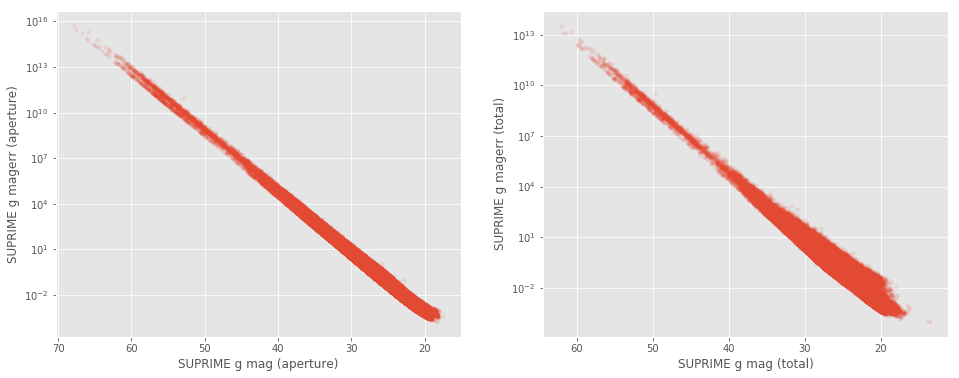

Megacam r mag (aperture)
    Error max: 90
    magerr > 10: Number of objects = 198, min mag = 28.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam r mag (total)
    Error max: 90
    magerr > 10: Number of objects = 165, min mag = 28.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



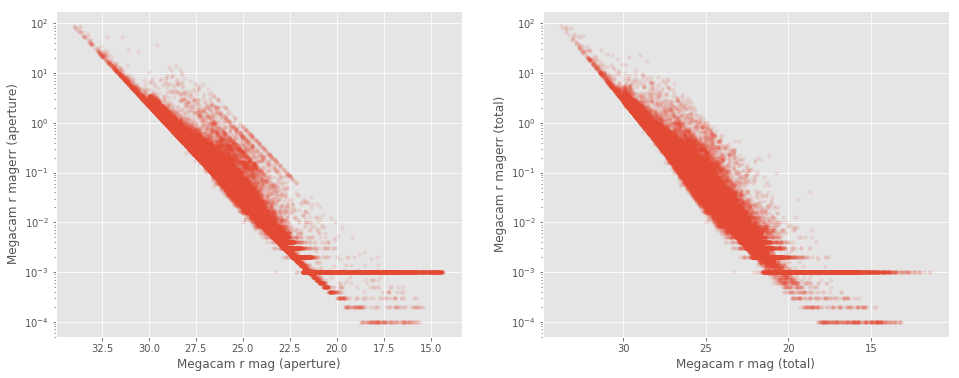

DECam r mag (aperture)
    Error max: 51538
    magerr > 10: Number of objects = 1761, min mag = 26.8
    magerr > 100: Number of objects = 161, min mag = 29.4
    magerr > 1000: Number of objects = 13, min mag = 32.7

DECam r mag (total)
    Error max: 633458
    magerr > 10: Number of objects = 723, min mag = 16.6
    magerr > 100: Number of objects = 85, min mag = 23.6
    magerr > 1000: Number of objects = 11, min mag = 32.9



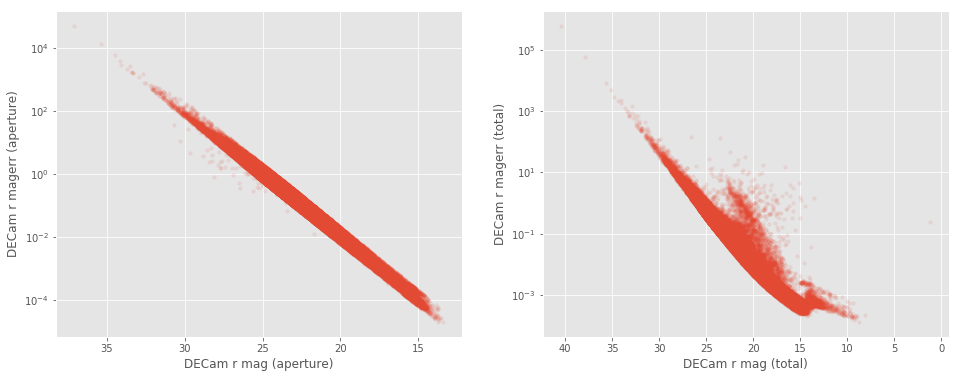

GPC1 r mag (aperture)
    Error max: 2643
    magerr > 10: Number of objects = 167, min mag = 15.6
    magerr > 100: Number of objects = 16, min mag = 15.6
    magerr > 1000: Number of objects = 2, min mag = 30.7

GPC1 r mag (total)
    Error max: 3454
    magerr > 10: Number of objects = 206, min mag = 23.9
    magerr > 100: Number of objects = 16, min mag = 27.3
    magerr > 1000: Number of objects = 2, min mag = 31.6



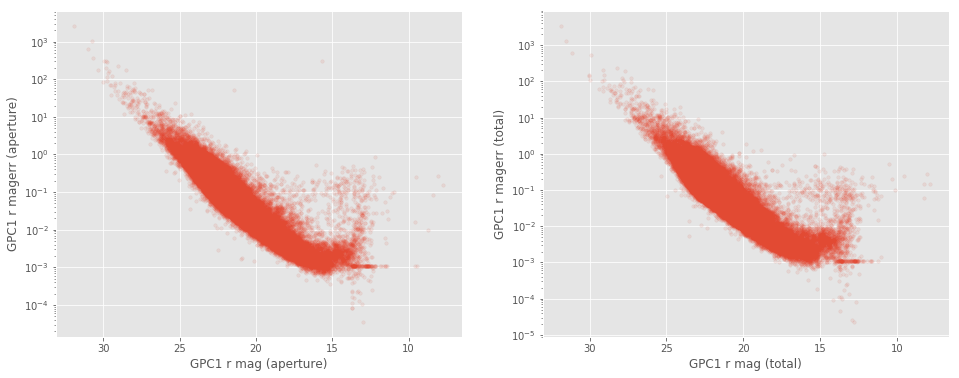

KIDS r mag (aperture)
    Error max: 1514
    magerr > 10: Number of objects = 84, min mag = 28.4
    magerr > 100: Number of objects = 13, min mag = 31.6
    magerr > 1000: Number of objects = 2, min mag = 34.2

KIDS r mag (total)
    Error max: 2553
    magerr > 10: Number of objects = 101, min mag = 26.4
    magerr > 100: Number of objects = 7, min mag = 30.9
    magerr > 1000: Number of objects = 1, min mag = 34.7



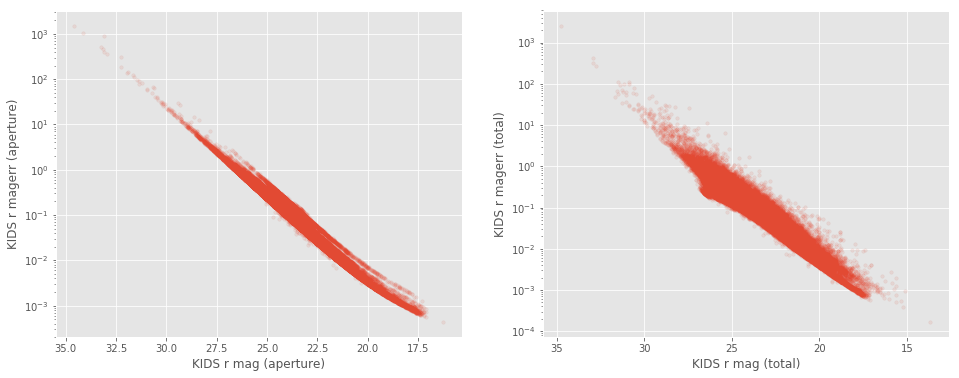

SUPRIME r mag (aperture)
    Error max: 425207496704
    magerr > 10: Number of objects = 34124, min mag = 29.1
    magerr > 100: Number of objects = 23566, min mag = 31.9
    magerr > 1000: Number of objects = 17975, min mag = 34.2

SUPRIME r mag (total)
    Error max: 1027453616128
    magerr > 10: Number of objects = 20983, min mag = 24.8
    magerr > 100: Number of objects = 9117, min mag = 25.3
    magerr > 1000: Number of objects = 5780, min mag = 33.6



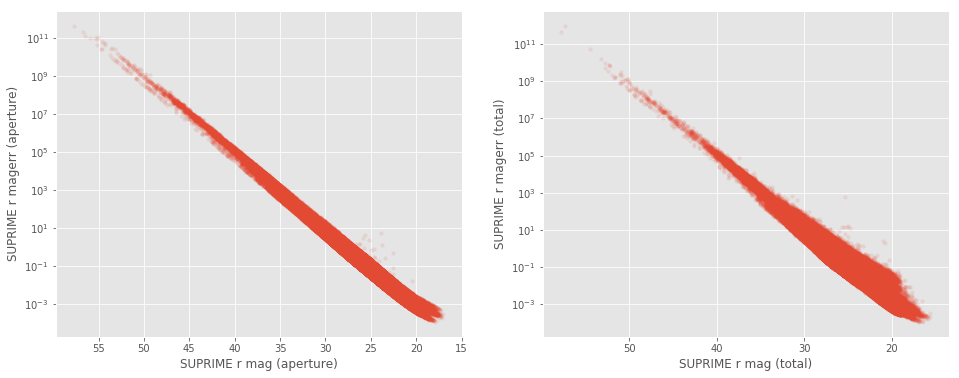

Megacam i mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 180, min mag = 29.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam i mag (total)
    Error max: 88
    magerr > 10: Number of objects = 148, min mag = 28.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



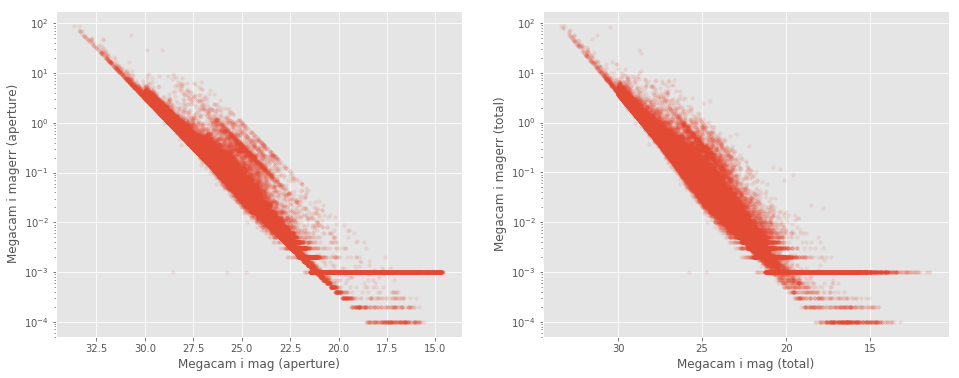

GPC1 i mag (aperture)
    Error max: 3610
    magerr > 10: Number of objects = 253, min mag = 20.3
    magerr > 100: Number of objects = 23, min mag = 20.3
    magerr > 1000: Number of objects = 5, min mag = 31.1

GPC1 i mag (total)
    Error max: 3015
    magerr > 10: Number of objects = 295, min mag = 22.2
    magerr > 100: Number of objects = 33, min mag = 23.6
    magerr > 1000: Number of objects = 5, min mag = 29.9



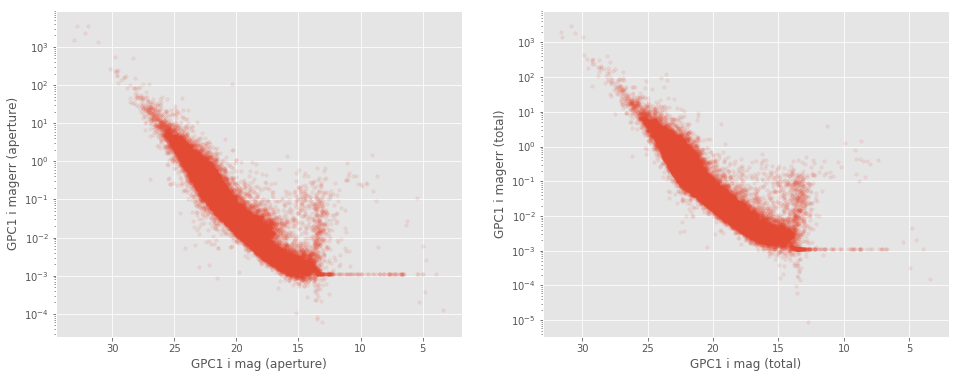

KIDS i mag (aperture)
    Error max: 6175
    magerr > 10: Number of objects = 671, min mag = 26.8
    magerr > 100: Number of objects = 69, min mag = 29.8
    magerr > 1000: Number of objects = 7, min mag = 32.6

KIDS i mag (total)
    Error max: 26856
    magerr > 10: Number of objects = 1243, min mag = 26.1
    magerr > 100: Number of objects = 103, min mag = 29.4
    magerr > 1000: Number of objects = 10, min mag = 33.1



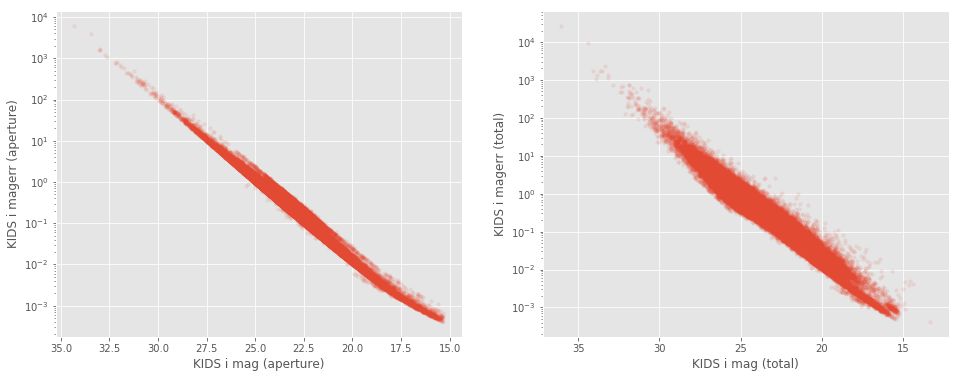

SUPRIME i mag (aperture)
    Error max: 119242611490816
    magerr > 10: Number of objects = 7636, min mag = 28.7
    magerr > 100: Number of objects = 3116, min mag = 31.8
    magerr > 1000: Number of objects = 1669, min mag = 34.3

SUPRIME i mag (total)
    Error max: 1093969379328
    magerr > 10: Number of objects = 8292, min mag = 23.5
    magerr > 100: Number of objects = 1970, min mag = 24.6
    magerr > 1000: Number of objects = 853, min mag = 32.9



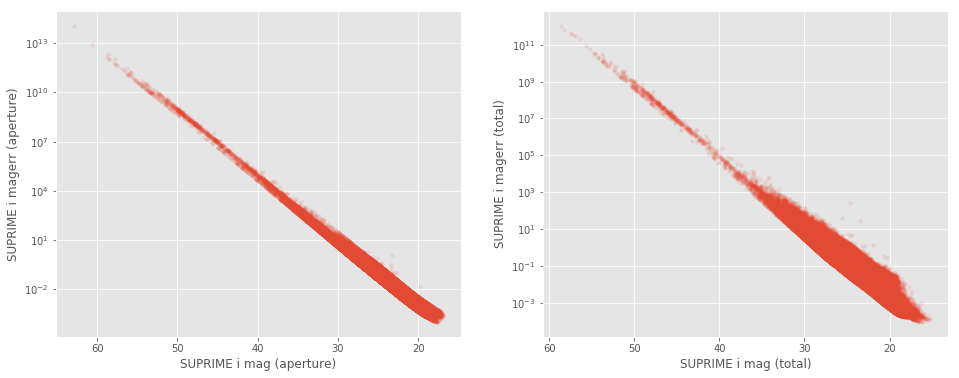

Megacam z mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 258, min mag = 29.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam z mag (total)
    Error max: 88
    magerr > 10: Number of objects = 218, min mag = 27.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



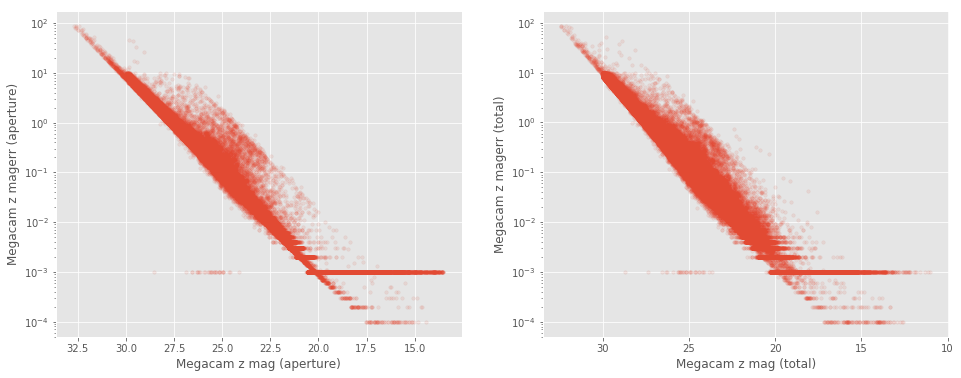

DECam z mag (aperture)
    Error max: 11224
    magerr > 10: Number of objects = 1623, min mag = 26.0
    magerr > 100: Number of objects = 136, min mag = 28.5
    magerr > 1000: Number of objects = 14, min mag = 32.2

DECam z mag (total)
    Error max: 3906
    magerr > 10: Number of objects = 318, min mag = 15.0
    magerr > 100: Number of objects = 32, min mag = 30.0
    magerr > 1000: Number of objects = 3, min mag = 31.5



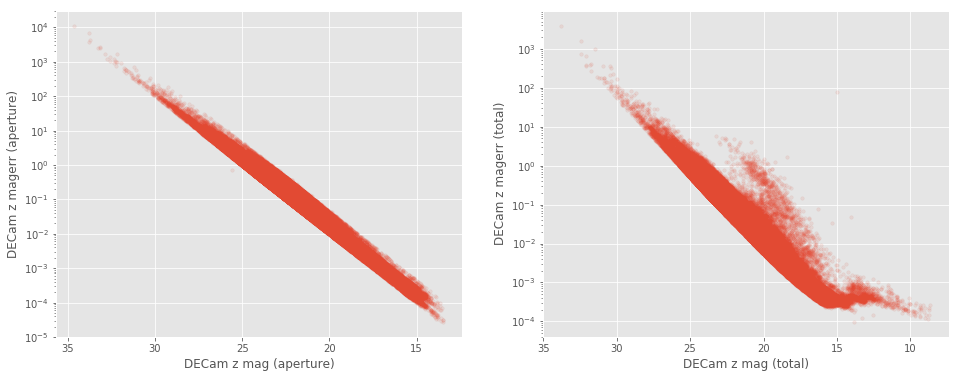

GPC1 z mag (aperture)
    Error max: 8592
    magerr > 10: Number of objects = 401, min mag = 20.9
    magerr > 100: Number of objects = 33, min mag = 27.1
    magerr > 1000: Number of objects = 8, min mag = 30.2

GPC1 z mag (total)
    Error max: 5307
    magerr > 10: Number of objects = 489, min mag = 23.0
    magerr > 100: Number of objects = 43, min mag = 25.9
    magerr > 1000: Number of objects = 4, min mag = 29.1



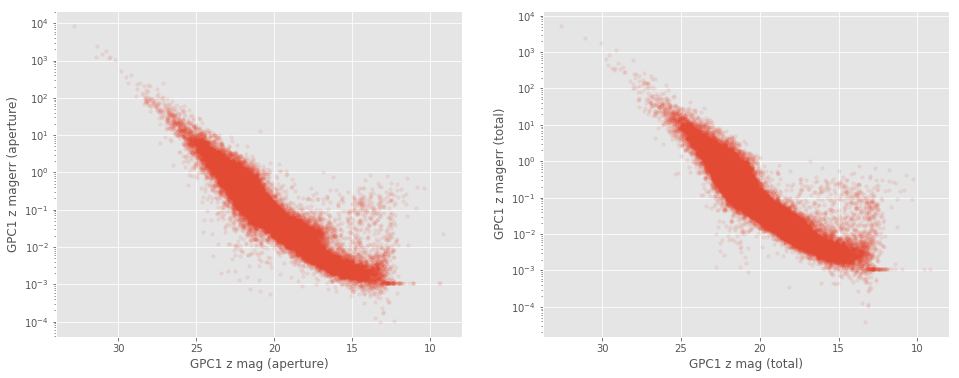

SUPRIME z mag (aperture)
    Error max: 13063169245184
    magerr > 10: Number of objects = 24902, min mag = 28.3
    magerr > 100: Number of objects = 11636, min mag = 30.9
    magerr > 1000: Number of objects = 6122, min mag = 33.4

SUPRIME z mag (total)
    Error max: 13484366495744
    magerr > 10: Number of objects = 17458, min mag = 26.3
    magerr > 100: Number of objects = 5272, min mag = 29.4
    magerr > 1000: Number of objects = 2370, min mag = 32.5



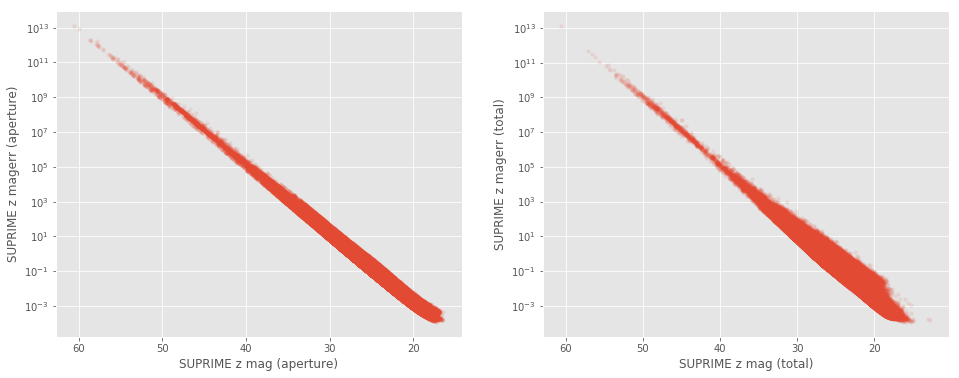

GPC1 y mag (aperture)
    Error max: 28371
    magerr > 10: Number of objects = 747, min mag = 20.2
    magerr > 100: Number of objects = 68, min mag = 25.2
    magerr > 1000: Number of objects = 8, min mag = 28.7

GPC1 y mag (total)
    Error max: 22499
    magerr > 10: Number of objects = 1204, min mag = 20.4
    magerr > 100: Number of objects = 96, min mag = 23.9
    magerr > 1000: Number of objects = 10, min mag = 28.3



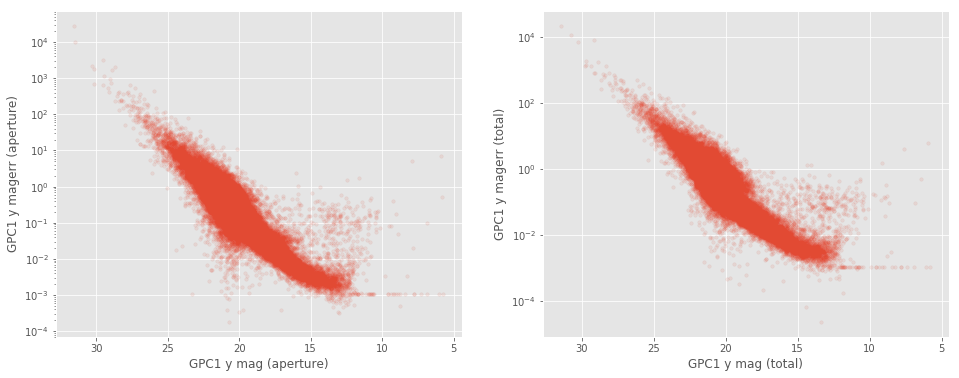

SUPRIME y mag (aperture)
    Error max: 16660573278175232
    magerr > 10: Number of objects = 79335, min mag = 27.4
    magerr > 100: Number of objects = 33506, min mag = 29.9
    magerr > 1000: Number of objects = 13368, min mag = 32.4

SUPRIME y mag (total)
    Error max: 70882185707520
    magerr > 10: Number of objects = 50081, min mag = 25.4
    magerr > 100: Number of objects = 14237, min mag = 27.8
    magerr > 1000: Number of objects = 5025, min mag = 31.1



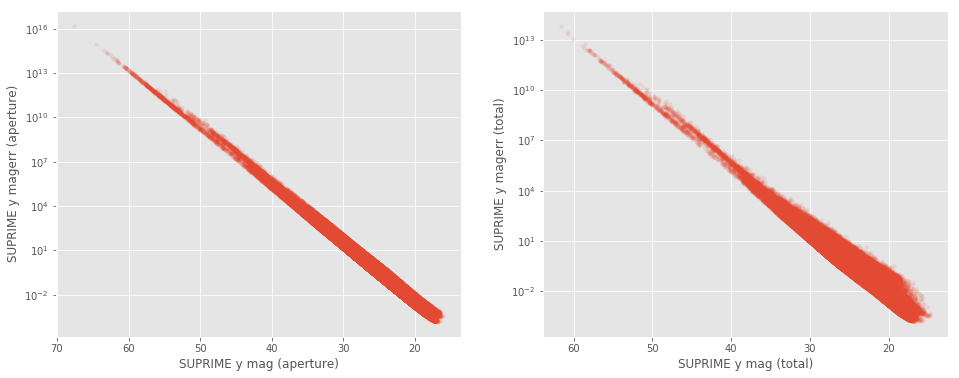

UKIDSS Y mag (aperture)
    Error max: 2647
    magerr > 10: Number of objects = 2, min mag = 28.8
    magerr > 100: Number of objects = 2, min mag = 28.8
    magerr > 1000: Number of objects = 1, min mag = 31.3

UKIDSS Y mag (total)
    Error max: 81
    magerr > 10: Number of objects = 13, min mag = 24.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



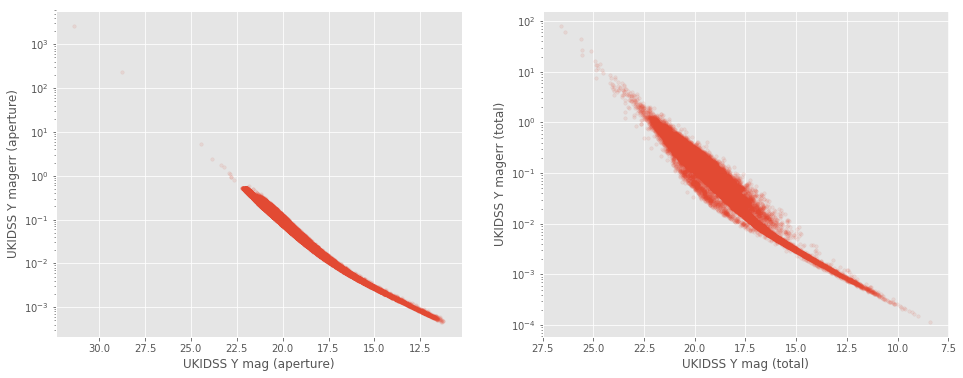

UKIDSS J mag (aperture)
    Error max: 164
    magerr > 10: Number of objects = 3, min mag = 25.0
    magerr > 100: Number of objects = 1, min mag = 27.8
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS J mag (total)
    Error max: 49
    magerr > 10: Number of objects = 5, min mag = 24.9
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



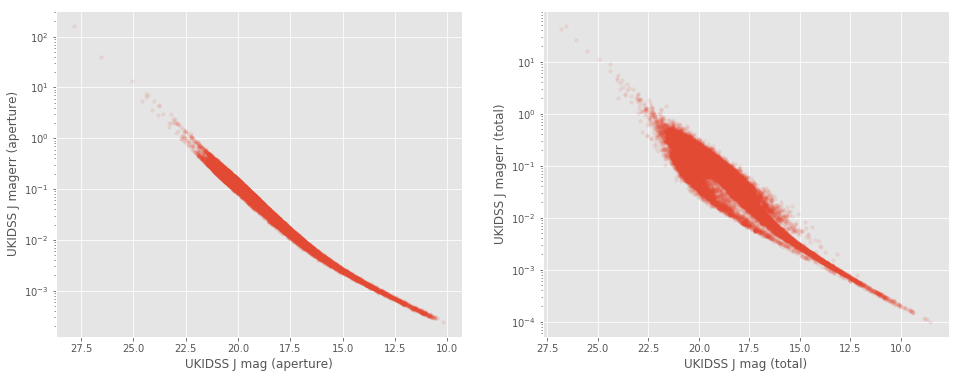

WIRCAM J mag (aperture)
    Error max: 89
    magerr > 10: Number of objects = 623, min mag = 27.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM J mag (total)
    Error max: 90
    magerr > 10: Number of objects = 735, min mag = 26.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



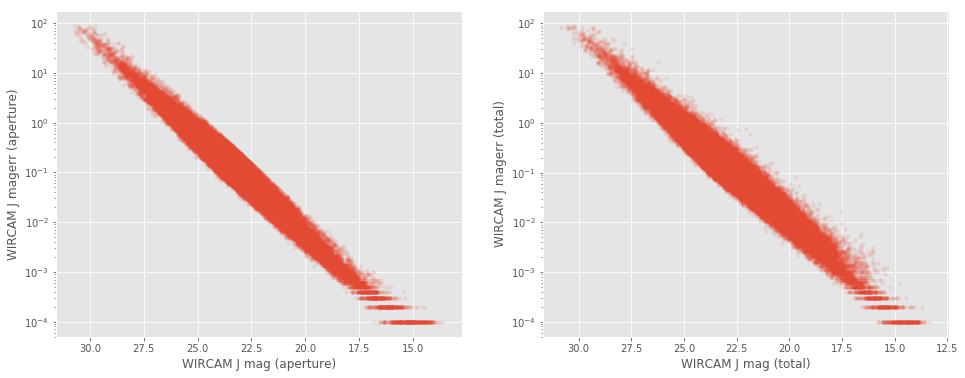

UKIDSS H mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS H mag (total)
    Error max: 137
    magerr > 10: Number of objects = 6, min mag = 24.1
    magerr > 100: Number of objects = 1, min mag = 26.5
    magerr > 1000: Number of objects = 0, min mag = nan



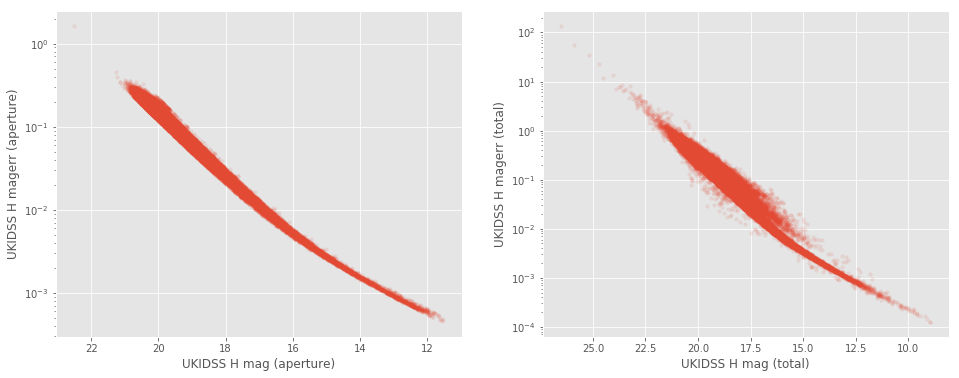

WIRCAM H mag (aperture)
    Error max: 84
    magerr > 10: Number of objects = 323, min mag = 28.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM H mag (total)
    Error max: 85
    magerr > 10: Number of objects = 325, min mag = 26.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



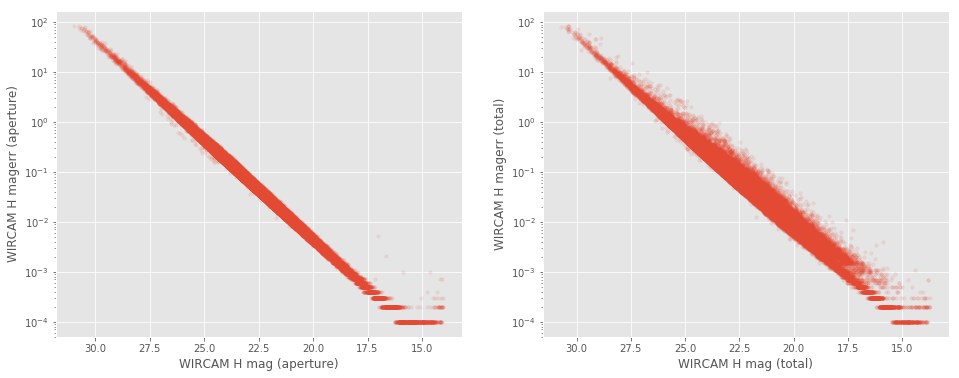

UKIDSS K mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS K mag (total)
    Error max: 116
    magerr > 10: Number of objects = 12, min mag = 23.7
    magerr > 100: Number of objects = 2, min mag = 26.2
    magerr > 1000: Number of objects = 0, min mag = nan



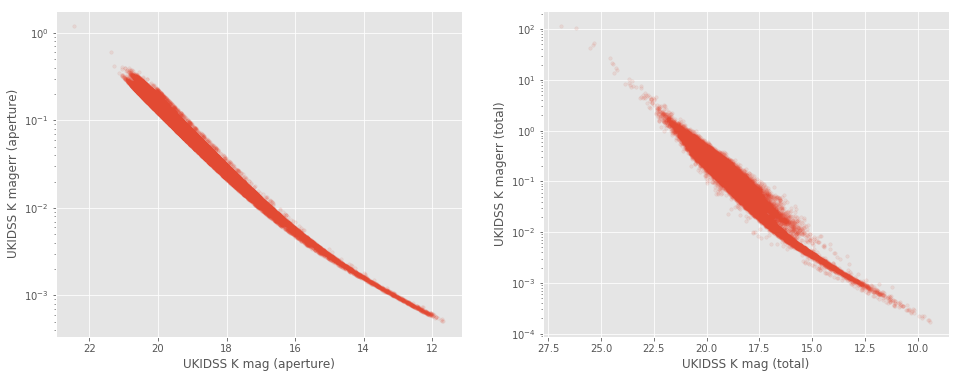

WIRCAM Ks mag (aperture)
    Error max: 73
    magerr > 10: Number of objects = 52, min mag = 28.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM Ks mag (total)
    Error max: 90
    magerr > 10: Number of objects = 116, min mag = 27.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



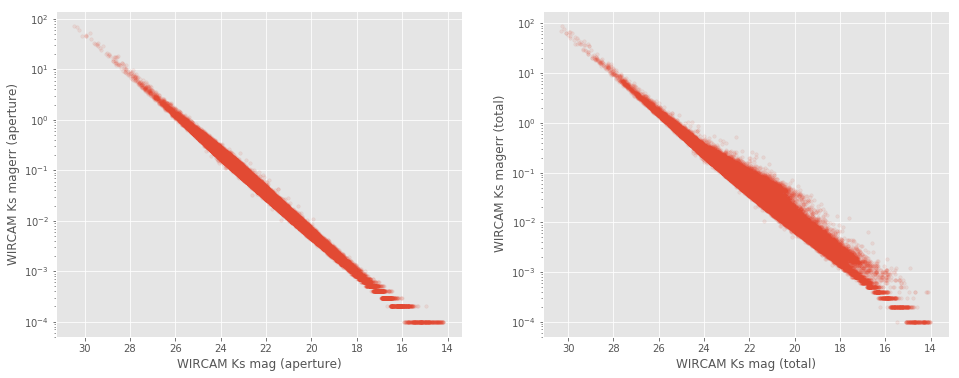

In [29]:
for mag in all_mags:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "kids_u":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [30]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None,  
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2:
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    # Comparing magnitudes
    ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
    ax2.plot(x2[mask], y2[mask], 'b.')
    if mask2 is not None:
        ax2.plot(x2[mask2], y2[mask2], 'g.')
    ax2.invert_xaxis()
    ax2.invert_yaxis()
    ax2.set_xlabel(labels2[0])
    ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()


### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 60


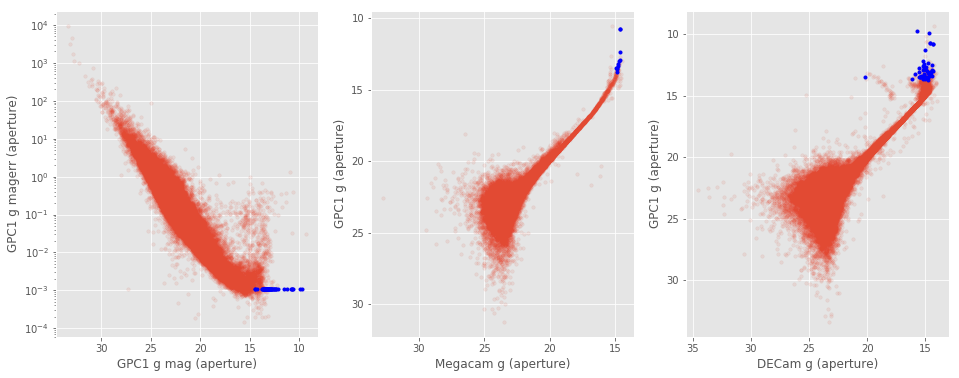

GPC1 r
   Number of flagged objects: 100


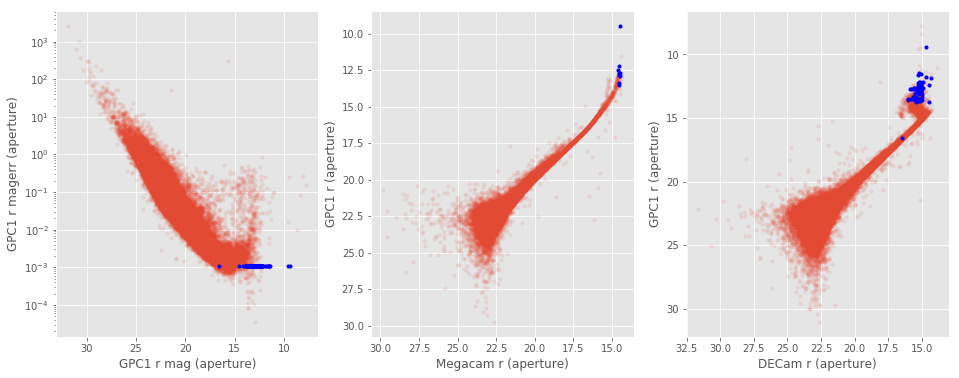

GPC1 i
   Number of flagged objects: 139


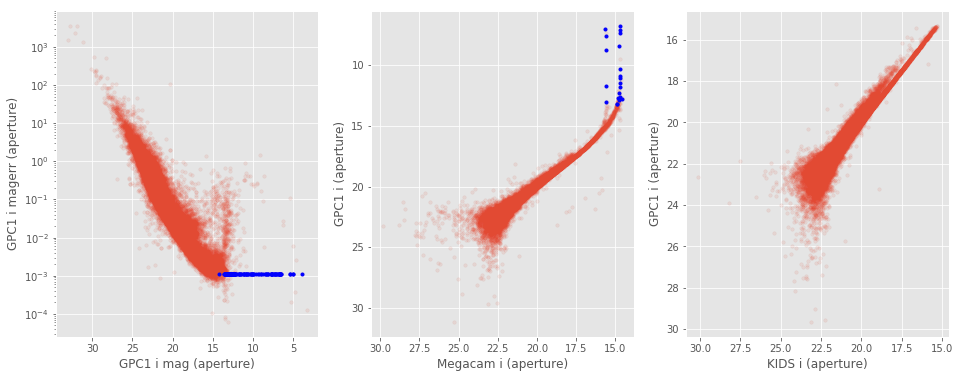

GPC1 z
   Number of flagged objects: 69


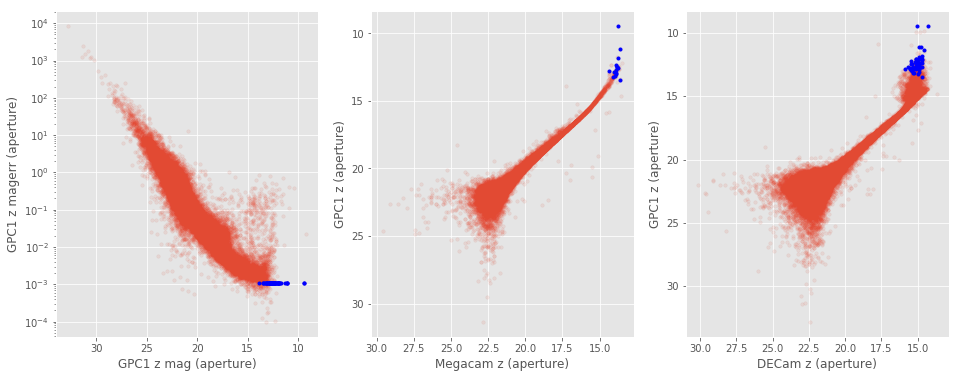

GPC1 y
   Number of flagged objects: 36


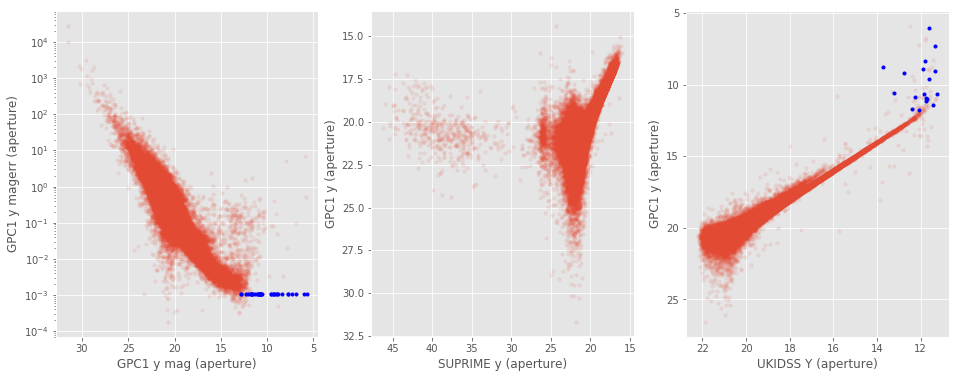

In [31]:
ps1_err = 0.0010860000038519502
bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [32]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

KIDS u (aperture) - Megacam u (aperture) (87528 sources):
- Median: 0.12
- Median Absolute Deviation: 0.40
- 1% percentile: -2.4094377899169923
- 99% percentile: 2.6359970092773435
Outliers separation: log(chi2) = 4.52
Number of outliers: 102



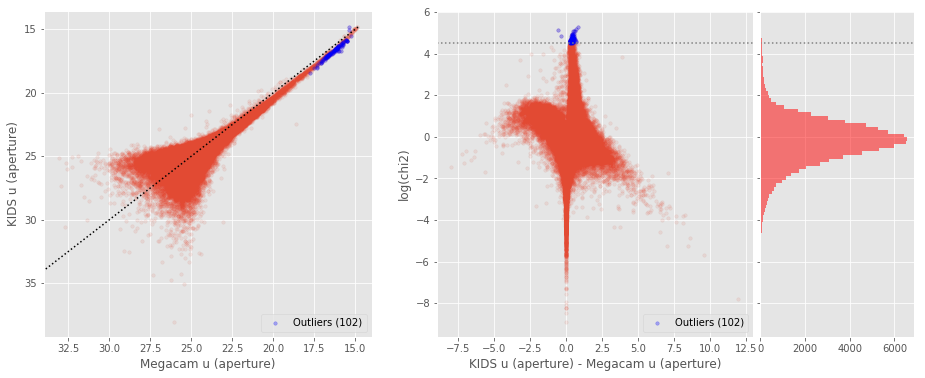

KIDS u (total) - Megacam u (total) (90662 sources):
- Median: 0.28
- Median Absolute Deviation: 0.44
- 1% percentile: -2.1613742637634275
- 99% percentile: 3.5204147148132314
Outliers separation: log(chi2) = 3.86
Number of outliers: 375



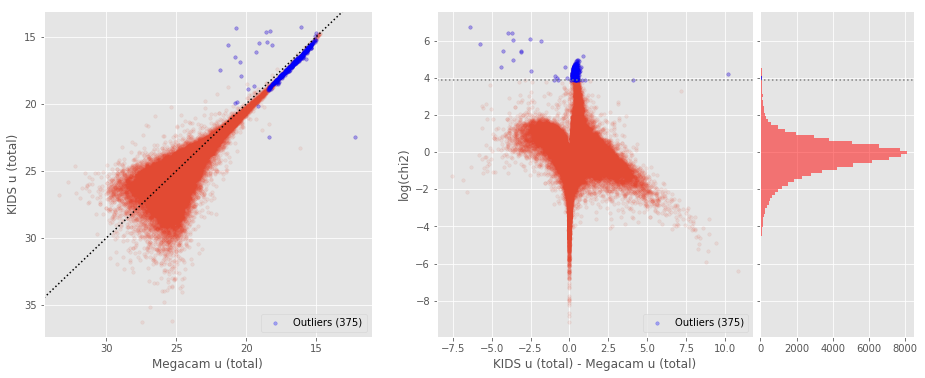

Megacam g (aperture) - GPC1 g (aperture) (24132 sources):
- Median: 0.19
- Median Absolute Deviation: 0.34
- 1% percentile: -2.654612846374512
- 99% percentile: 3.0448388099670405
Outliers separation: log(chi2) = 7.47
Number of outliers: 0



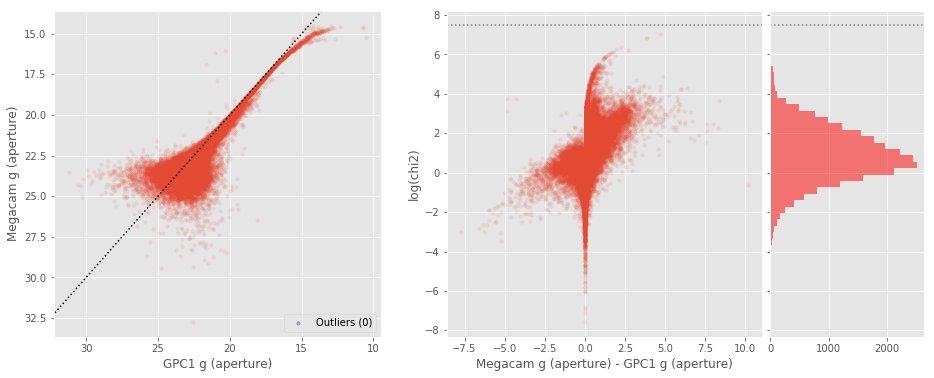

Megacam g (total) - GPC1 g (total) (24027 sources):
- Median: -0.06
- Median Absolute Deviation: 0.29
- 1% percentile: -2.2793175506591794
- 99% percentile: 3.465910682678225
Outliers separation: log(chi2) = 5.93
Number of outliers: 0



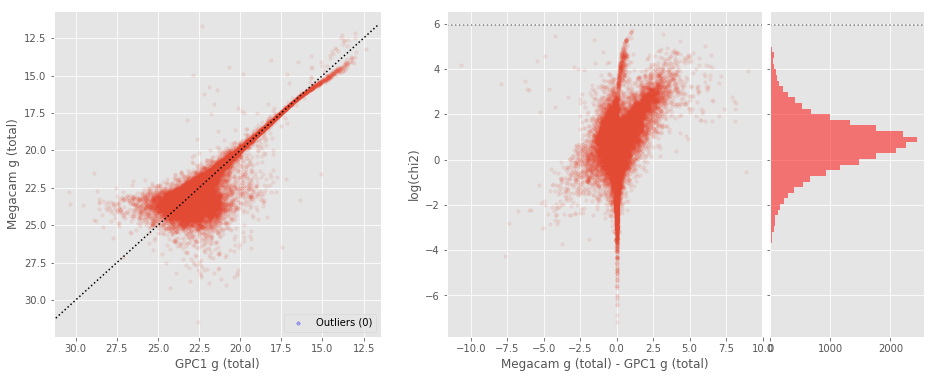

DECam g (aperture) - GPC1 g (aperture) (107646 sources):
- Median: 0.07
- Median Absolute Deviation: 0.31
- 1% percentile: -2.6432390213012695
- 99% percentile: 3.1713577270507836
Outliers separation: log(chi2) = 5.46
Number of outliers: 207



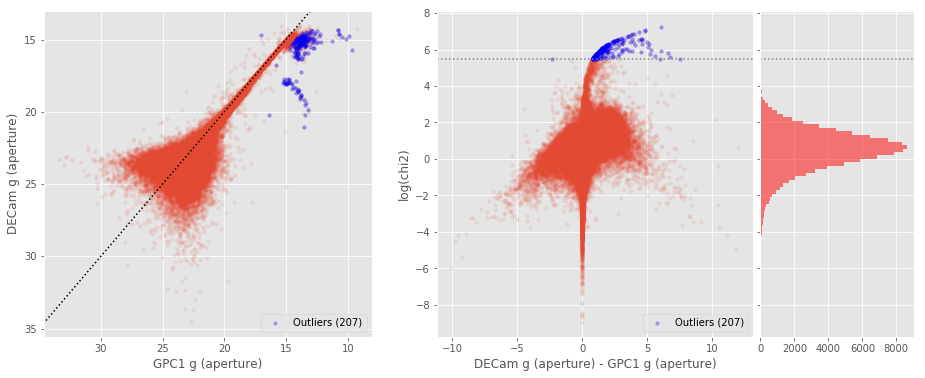

DECam g (total) - GPC1 g (total) (108171 sources):
- Median: 0.00
- Median Absolute Deviation: 0.29
- 1% percentile: -2.044808006286621
- 99% percentile: 3.62840633392334
Outliers separation: log(chi2) = 5.76
Number of outliers: 5



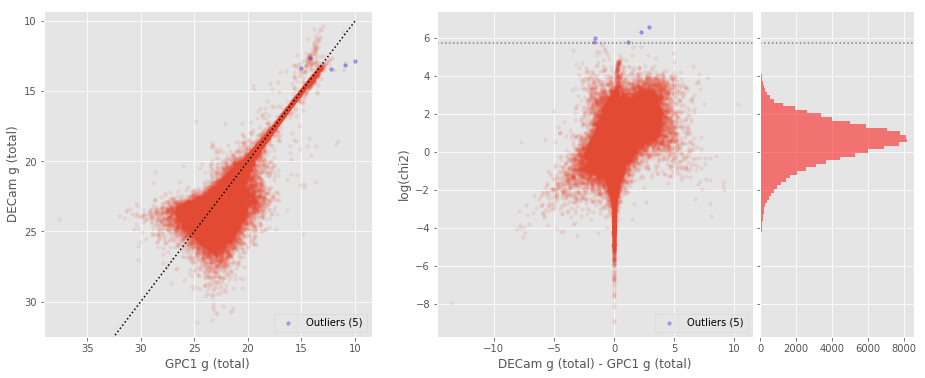

KIDS g (aperture) - GPC1 g (aperture) (25660 sources):
- Median: 0.38
- Median Absolute Deviation: 0.38
- 1% percentile: -2.436070594787598
- 99% percentile: 3.0642630577087404
Outliers separation: log(chi2) = 7.46
Number of outliers: 0



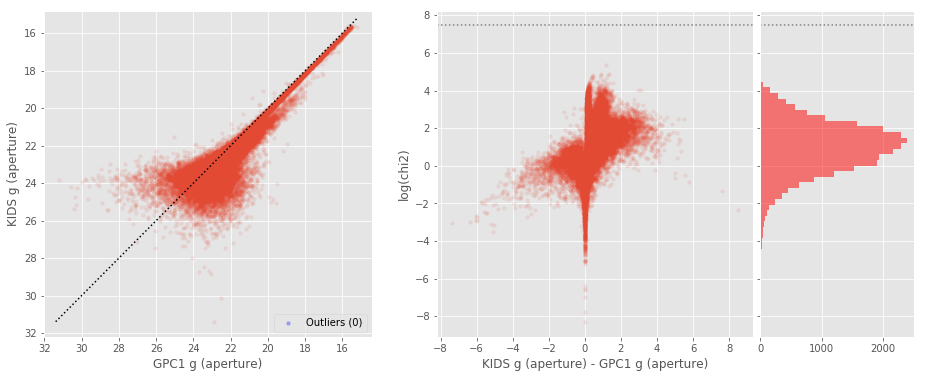

KIDS g (total) - GPC1 g (total) (25584 sources):
- Median: 0.18
- Median Absolute Deviation: 0.29
- 1% percentile: -1.8934726333618164
- 99% percentile: 3.8469621086120607
Outliers separation: log(chi2) = 6.31
Number of outliers: 0



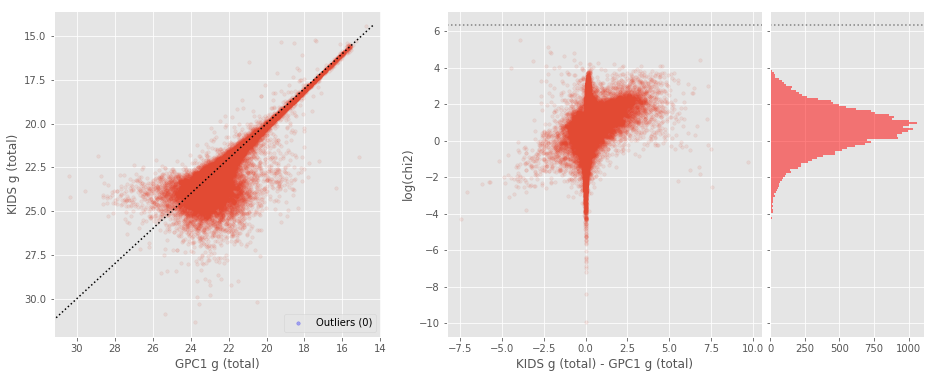

SUPRIME g (aperture) - GPC1 g (aperture) (108218 sources):
- Median: 0.32
- Median Absolute Deviation: 0.44
- 1% percentile: -2.6096390151977538
- 99% percentile: 5.444828033447266
Outliers separation: log(chi2) = 7.37
Number of outliers: 0



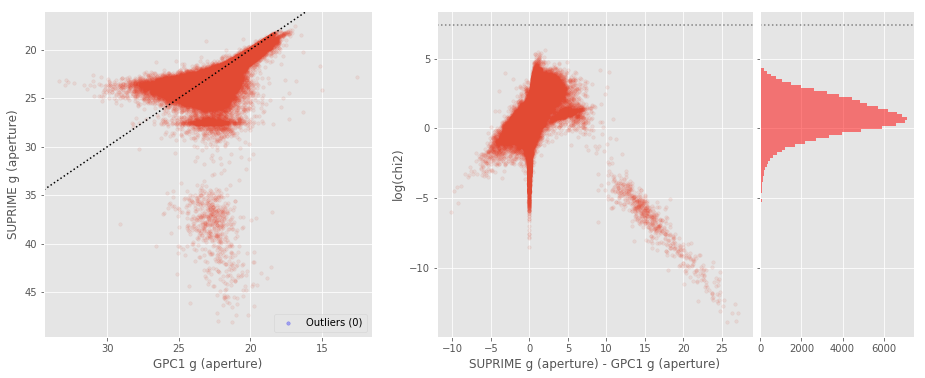

SUPRIME g (total) - GPC1 g (total) (107684 sources):
- Median: 0.04
- Median Absolute Deviation: 0.36
- 1% percentile: -2.1164352226257326
- 99% percentile: 5.233756103515622
Outliers separation: log(chi2) = 6.02
Number of outliers: 0



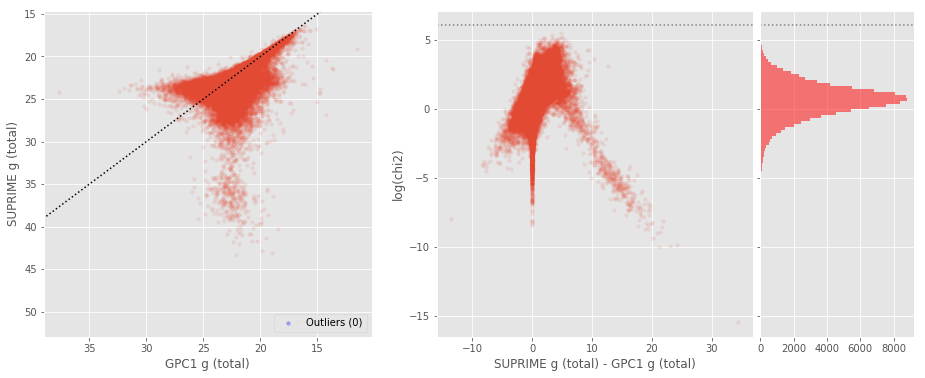

DECam g (aperture) - Megacam g (aperture) (77721 sources):
- Median: -0.06
- Median Absolute Deviation: 0.25
- 1% percentile: -1.371719741821289
- 99% percentile: 2.7717914581298837
Outliers separation: log(chi2) = 4.84
Number of outliers: 153



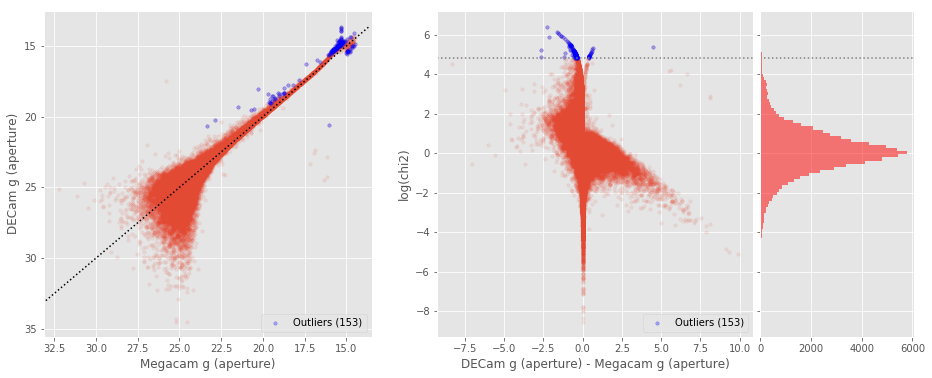

DECam g (total) - Megacam g (total) (80696 sources):
- Median: 0.26
- Median Absolute Deviation: 0.21
- 1% percentile: -0.587159252166748
- 99% percentile: 2.696030426025396
Outliers separation: log(chi2) = 3.94
Number of outliers: 398



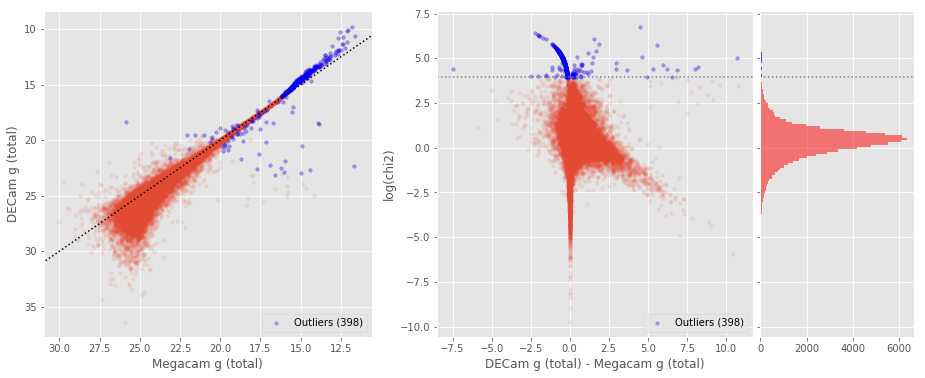

KIDS g (aperture) - Megacam g (aperture) (111750 sources):
- Median: 0.19
- Median Absolute Deviation: 0.21
- 1% percentile: -0.8704133605957032
- 99% percentile: 2.0496947669982903
Outliers separation: log(chi2) = 4.27
Number of outliers: 60



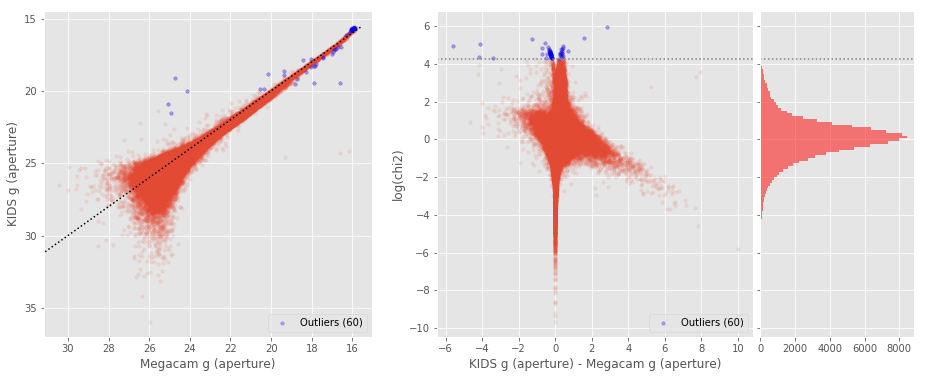

KIDS g (total) - Megacam g (total) (112909 sources):
- Median: 0.49
- Median Absolute Deviation: 0.30
- 1% percentile: -0.5638516998291017
- 99% percentile: 3.2279013061523427
Outliers separation: log(chi2) = 3.77
Number of outliers: 427



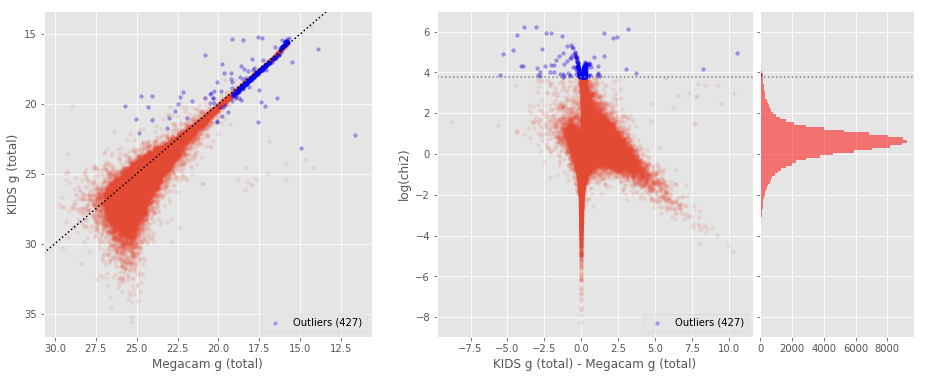

SUPRIME g (aperture) - Megacam g (aperture) (463386 sources):
- Median: -0.00
- Median Absolute Deviation: 0.18
- 1% percentile: -1.3828239440917969
- 99% percentile: 2.4473174095153833
Outliers separation: log(chi2) = 4.87
Number of outliers: 161



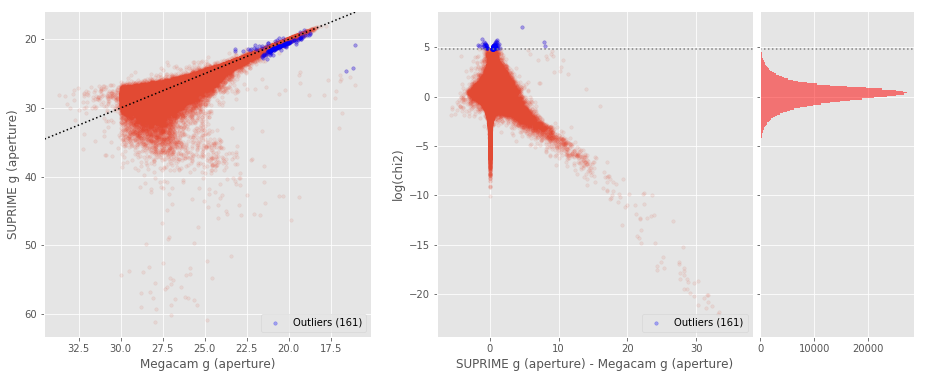

SUPRIME g (total) - Megacam g (total) (432985 sources):
- Median: -0.00
- Median Absolute Deviation: 0.25
- 1% percentile: -2.4936129760742185
- 99% percentile: 2.745068817138666
Outliers separation: log(chi2) = 5.40
Number of outliers: 38



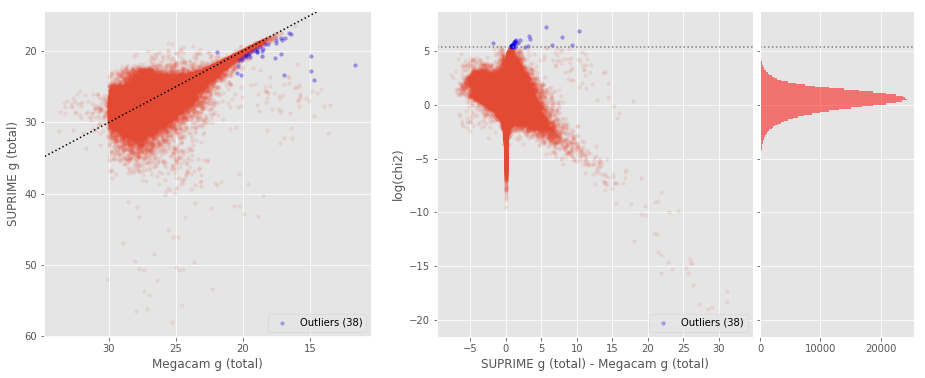

KIDS g (aperture) - DECam g (aperture) (76603 sources):
- Median: 0.24
- Median Absolute Deviation: 0.30
- 1% percentile: -2.502174530029297
- 99% percentile: 1.829255371093745
Outliers separation: log(chi2) = 5.32
Number of outliers: 5



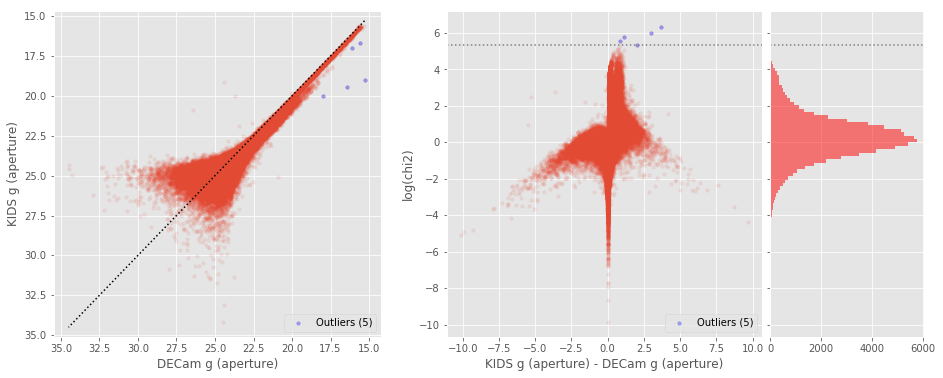

KIDS g (total) - DECam g (total) (79900 sources):
- Median: 0.17
- Median Absolute Deviation: 0.25
- 1% percentile: -1.753904094696045
- 99% percentile: 2.109712429046628
Outliers separation: log(chi2) = 4.52
Number of outliers: 18



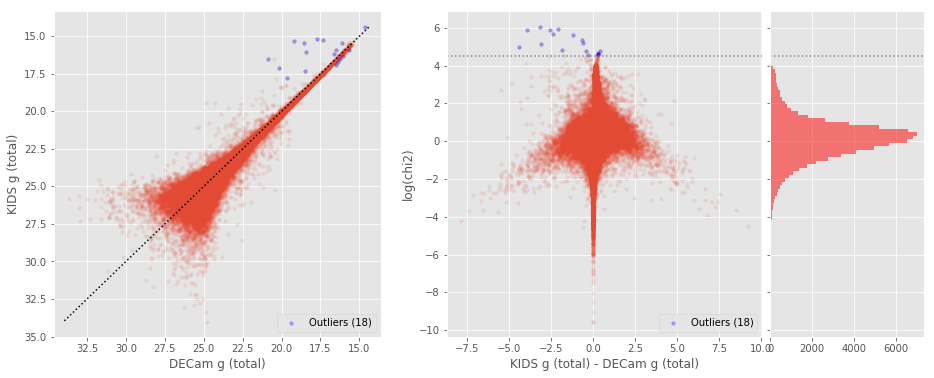

SUPRIME g (aperture) - DECam g (aperture) (322393 sources):
- Median: 0.12
- Median Absolute Deviation: 0.31
- 1% percentile: -2.6941718292236327
- 99% percentile: 3.988408126831078
Outliers separation: log(chi2) = 5.32
Number of outliers: 61



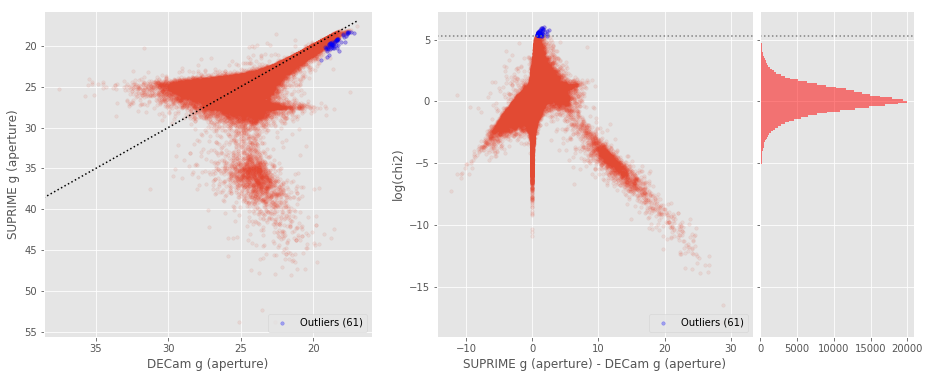

SUPRIME g (total) - DECam g (total) (331934 sources):
- Median: -0.16
- Median Absolute Deviation: 0.23
- 1% percentile: -2.432461643218994
- 99% percentile: 3.2051278495788473
Outliers separation: log(chi2) = 4.29
Number of outliers: 211



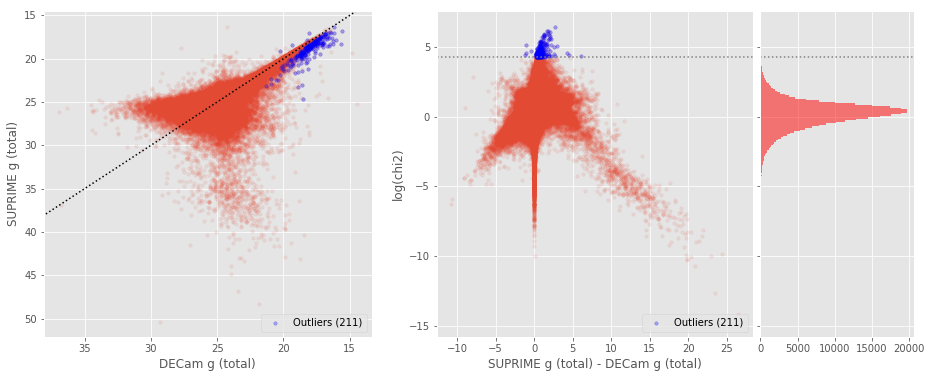

SUPRIME g (aperture) - KIDS g (aperture) (124940 sources):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -2.0132504081726075
- 99% percentile: 1.312053031921387
Outliers separation: log(chi2) = 4.03
Number of outliers: 6



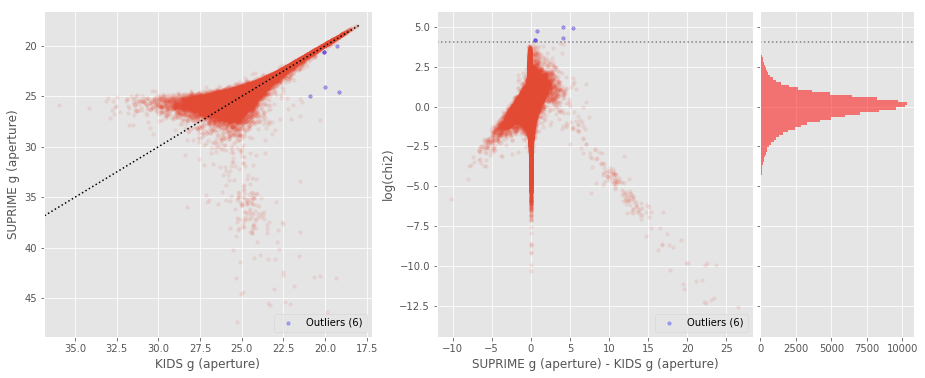

SUPRIME g (total) - KIDS g (total) (125829 sources):
- Median: -0.44
- Median Absolute Deviation: 0.31
- 1% percentile: -3.1919830322265628
- 99% percentile: 1.440004119873048
Outliers separation: log(chi2) = 3.85
Number of outliers: 54



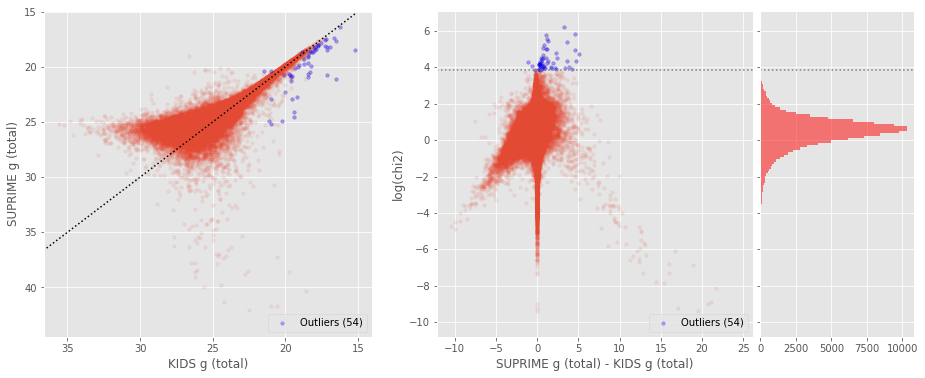

Megacam r (aperture) - GPC1 r (aperture) (25425 sources):
- Median: 0.12
- Median Absolute Deviation: 0.21
- 1% percentile: -1.6077203369140625
- 99% percentile: 2.0297761535644527
Outliers separation: log(chi2) = 7.24
Number of outliers: 0



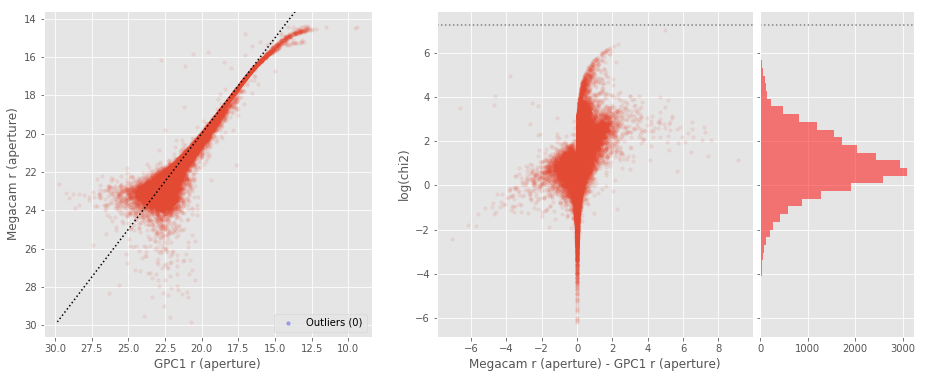

Megacam r (total) - GPC1 r (total) (25353 sources):
- Median: -0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -1.4534352874755858
- 99% percentile: 2.414124221801757
Outliers separation: log(chi2) = 5.58
Number of outliers: 3



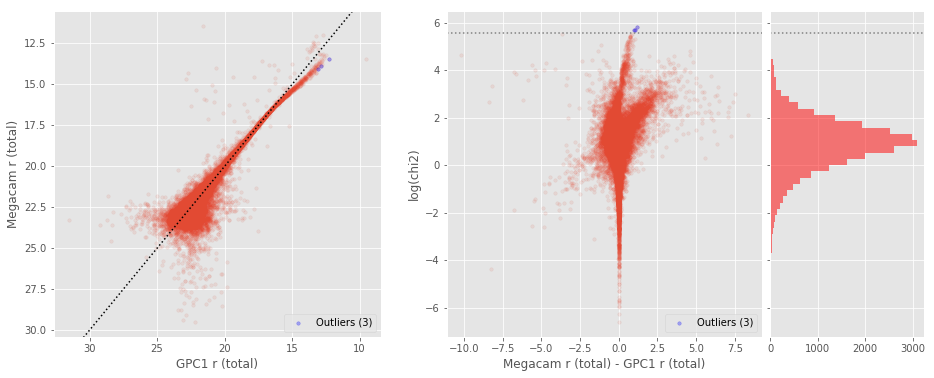

DECam r (aperture) - GPC1 r (aperture) (114359 sources):
- Median: -0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -1.8205731201171877
- 99% percentile: 1.9238129806518551
Outliers separation: log(chi2) = 5.35
Number of outliers: 440



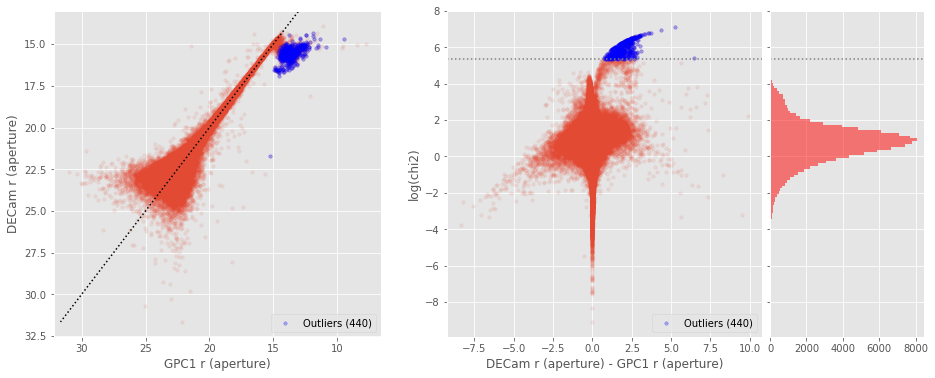

DECam r (total) - GPC1 r (total) (114196 sources):
- Median: -0.19
- Median Absolute Deviation: 0.17
- 1% percentile: -1.6214006423950196
- 99% percentile: 2.1555244445800783
Outliers separation: log(chi2) = 6.11
Number of outliers: 5



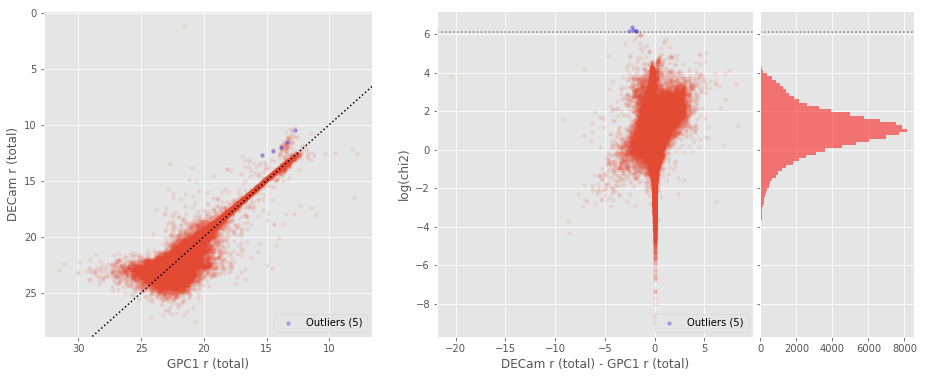

KIDS r (aperture) - GPC1 r (aperture) (26567 sources):
- Median: 0.15
- Median Absolute Deviation: 0.26
- 1% percentile: -1.6038119888305664
- 99% percentile: 1.7364138793945312
Outliers separation: log(chi2) = 6.62
Number of outliers: 0



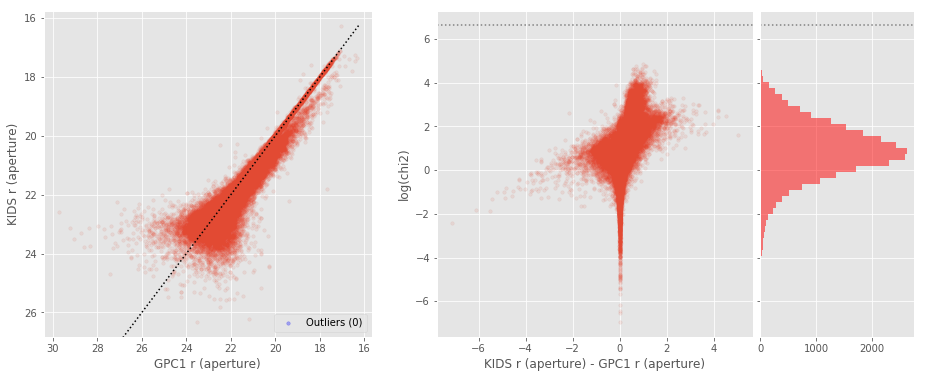

KIDS r (total) - GPC1 r (total) (26487 sources):
- Median: -0.05
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2124087905883787
- 99% percentile: 2.2392057800292955
Outliers separation: log(chi2) = 5.31
Number of outliers: 0



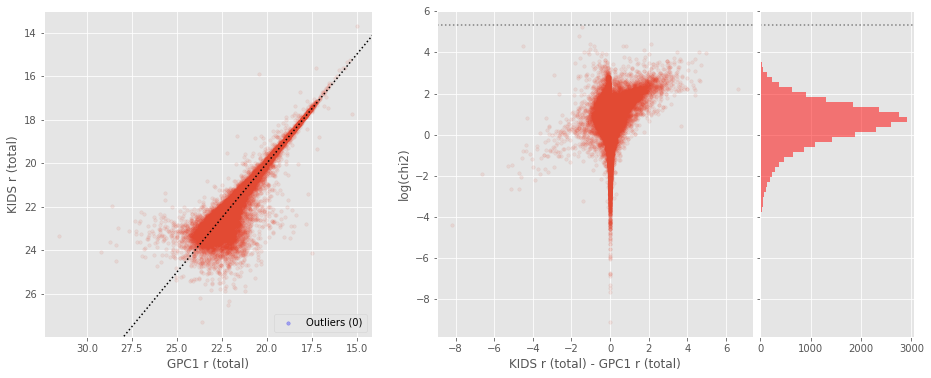

SUPRIME r (aperture) - GPC1 r (aperture) (113996 sources):
- Median: 0.18
- Median Absolute Deviation: 0.29
- 1% percentile: -1.6657604217529296
- 99% percentile: 17.87581777572634
Outliers separation: log(chi2) = 6.85
Number of outliers: 0



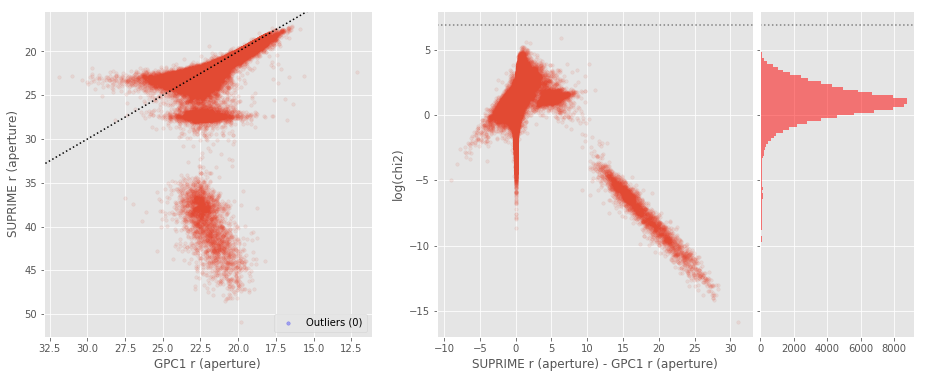

SUPRIME r (total) - GPC1 r (total) (112484 sources):
- Median: -0.14
- Median Absolute Deviation: 0.20
- 1% percentile: -1.4203893280029298
- 99% percentile: 13.283927936553955
Outliers separation: log(chi2) = 5.66
Number of outliers: 1



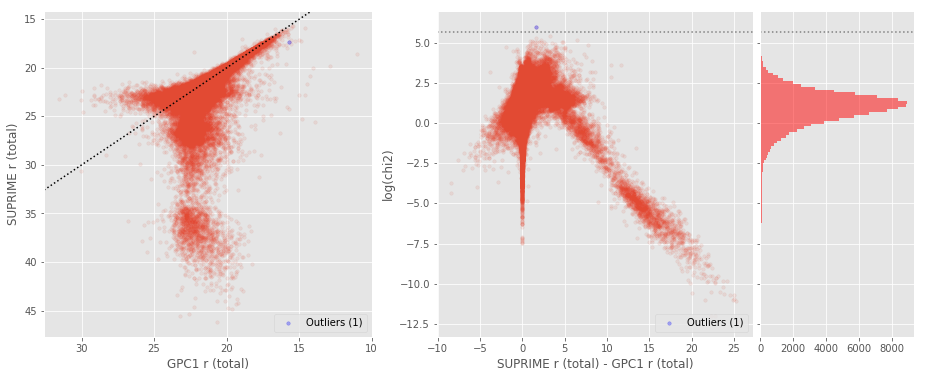

DECam r (aperture) - Megacam r (aperture) (82548 sources):
- Median: -0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -1.0304431343078613
- 99% percentile: 2.262820796966551
Outliers separation: log(chi2) = 6.28
Number of outliers: 0



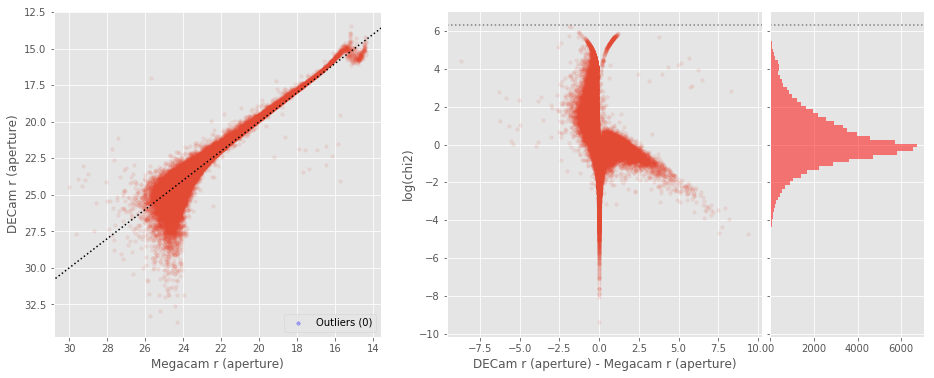

DECam r (total) - Megacam r (total) (84064 sources):
- Median: 0.08
- Median Absolute Deviation: 0.20
- 1% percentile: -0.7132890892028809
- 99% percentile: 1.7099626159667887
Outliers separation: log(chi2) = 4.53
Number of outliers: 426



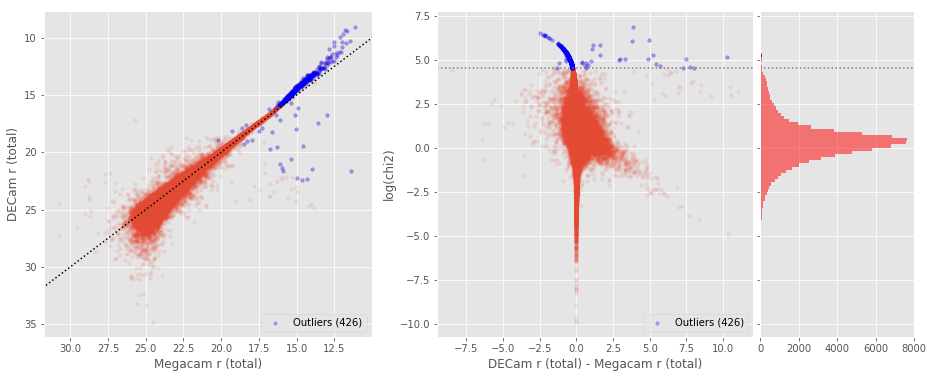

KIDS r (aperture) - Megacam r (aperture) (124397 sources):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -0.8437242126464845
- 99% percentile: 0.916284942626953
Outliers separation: log(chi2) = 4.74
Number of outliers: 7



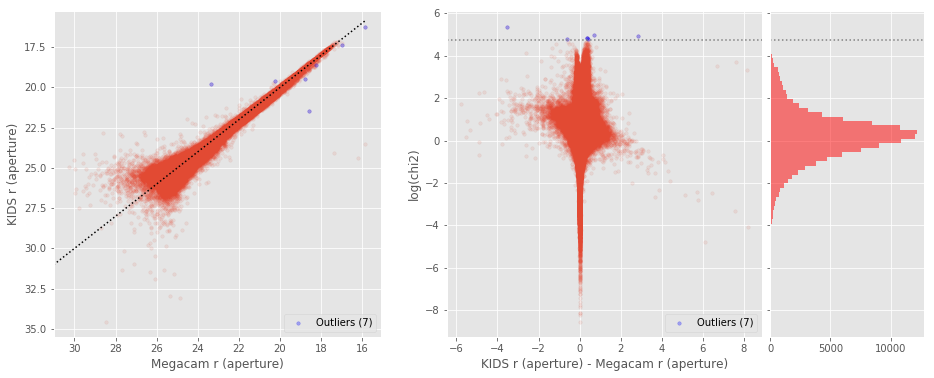

KIDS r (total) - Megacam r (total) (124435 sources):
- Median: 0.20
- Median Absolute Deviation: 0.18
- 1% percentile: -0.7498108673095704
- 99% percentile: 1.4176710510253911
Outliers separation: log(chi2) = 4.38
Number of outliers: 39



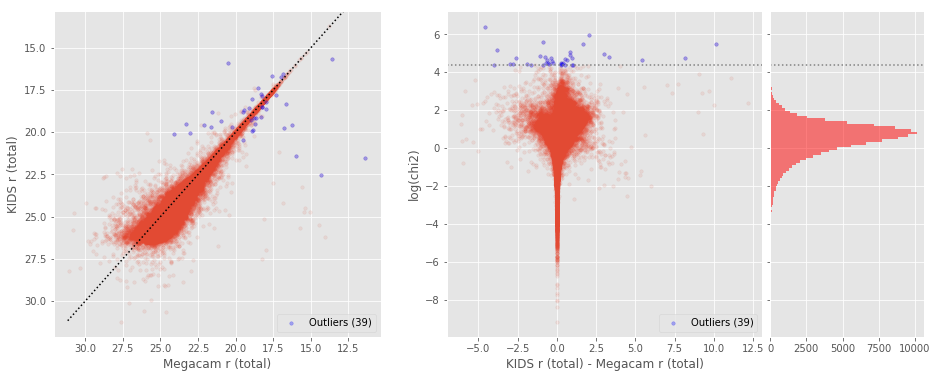

SUPRIME r (aperture) - Megacam r (aperture) (477241 sources):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.5389427185058593
- 99% percentile: 1.7137672424316397
Outliers separation: log(chi2) = 4.95
Number of outliers: 126



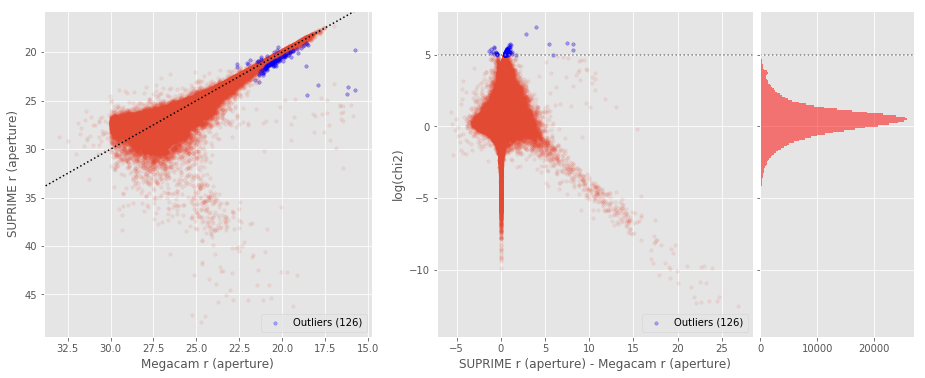

SUPRIME r (total) - Megacam r (total) (443357 sources):
- Median: -0.10
- Median Absolute Deviation: 0.22
- 1% percentile: -2.546052474975586
- 99% percentile: 2.2287962341308596
Outliers separation: log(chi2) = 5.69
Number of outliers: 23



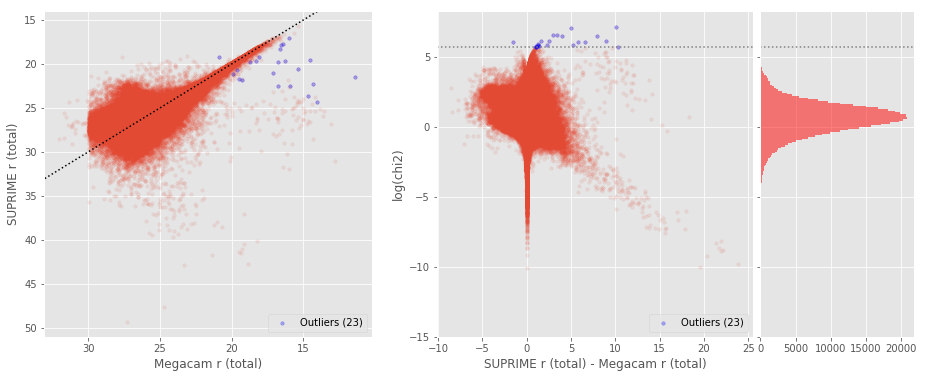

KIDS r (aperture) - DECam r (aperture) (83096 sources):
- Median: 0.19
- Median Absolute Deviation: 0.24
- 1% percentile: -2.0812751770019533
- 99% percentile: 1.1308261871337906
Outliers separation: log(chi2) = 6.38
Number of outliers: 0



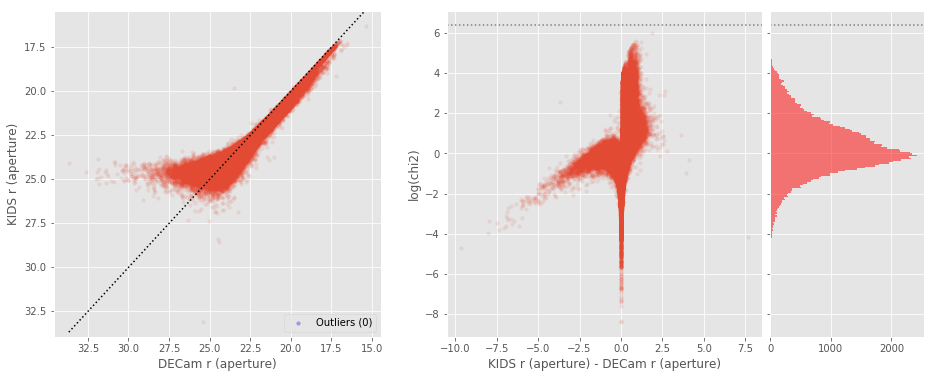

KIDS r (total) - DECam r (total) (84276 sources):
- Median: 0.11
- Median Absolute Deviation: 0.18
- 1% percentile: -1.138597011566162
- 99% percentile: 1.1307144165039062
Outliers separation: log(chi2) = 5.11
Number of outliers: 1



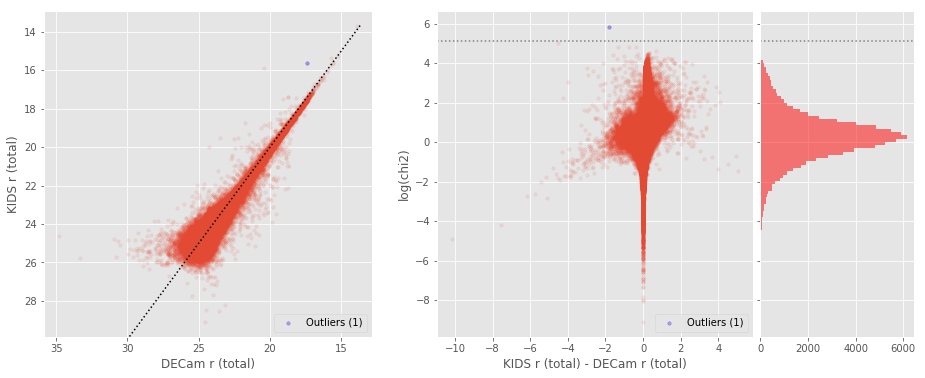

SUPRIME r (aperture) - DECam r (aperture) (339786 sources):
- Median: 0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -2.1643697738647463
- 99% percentile: 14.435583877563511
Outliers separation: log(chi2) = 6.41
Number of outliers: 0



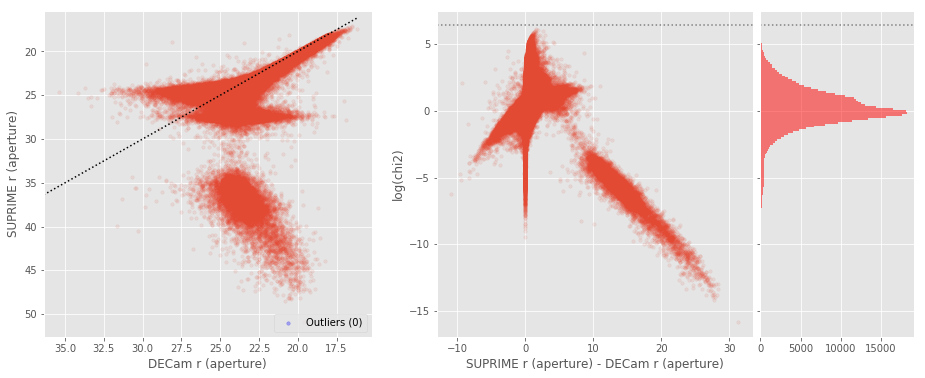

SUPRIME r (total) - DECam r (total) (342759 sources):
- Median: -0.07
- Median Absolute Deviation: 0.21
- 1% percentile: -1.6296356201171873
- 99% percentile: 10.262667350769004
Outliers separation: log(chi2) = 4.49
Number of outliers: 318



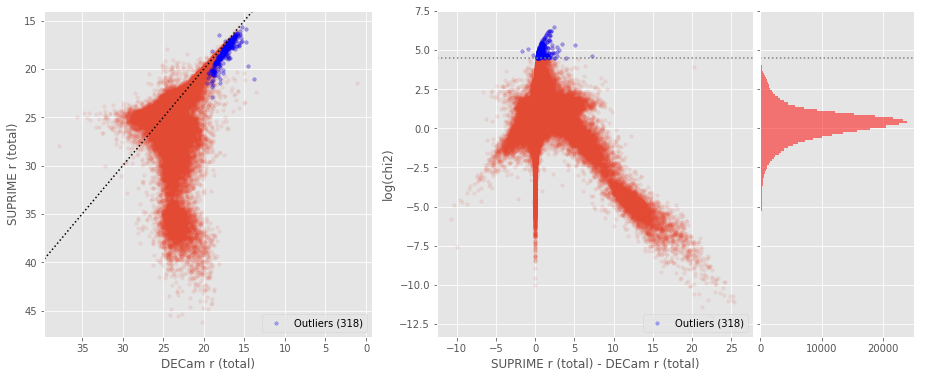

SUPRIME r (aperture) - KIDS r (aperture) (140714 sources):
- Median: -0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8950873947143554
- 99% percentile: 1.3212809181213354
Outliers separation: log(chi2) = 4.24
Number of outliers: 9



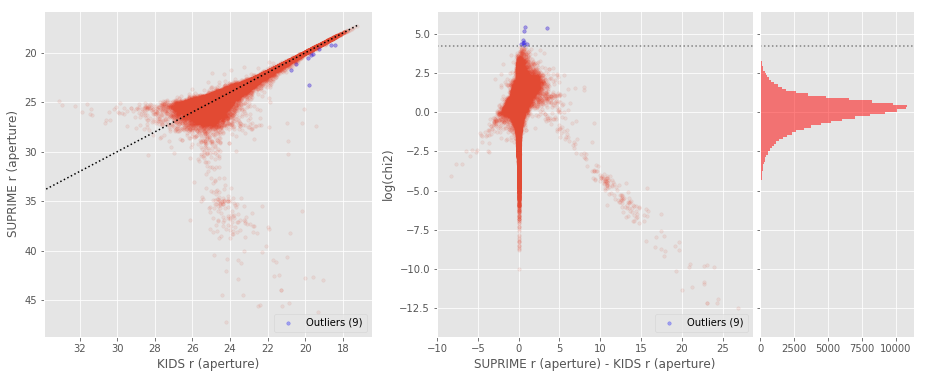

SUPRIME r (total) - KIDS r (total) (140085 sources):
- Median: -0.25
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4168214416503906
- 99% percentile: 1.6143164825439458
Outliers separation: log(chi2) = 4.30
Number of outliers: 74



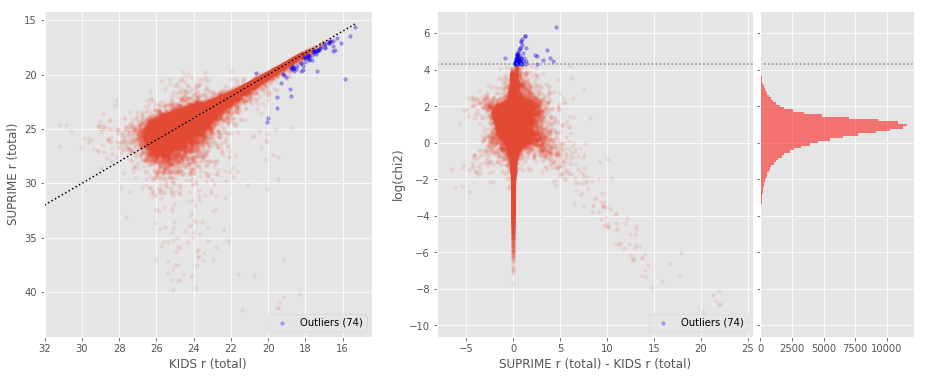

Megacam i (aperture) - GPC1 i (aperture) (25492 sources):
- Median: 0.10
- Median Absolute Deviation: 0.15
- 1% percentile: -1.2731646347045897
- 99% percentile: 1.5162459087371827
Outliers separation: log(chi2) = 6.09
Number of outliers: 28



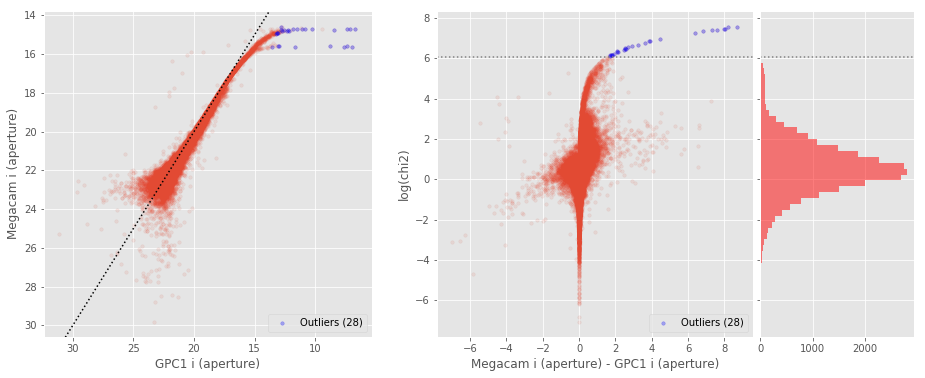

Megacam i (total) - GPC1 i (total) (25453 sources):
- Median: -0.16
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1180445861816406
- 99% percentile: 1.2914760589599603
Outliers separation: log(chi2) = 5.17
Number of outliers: 48



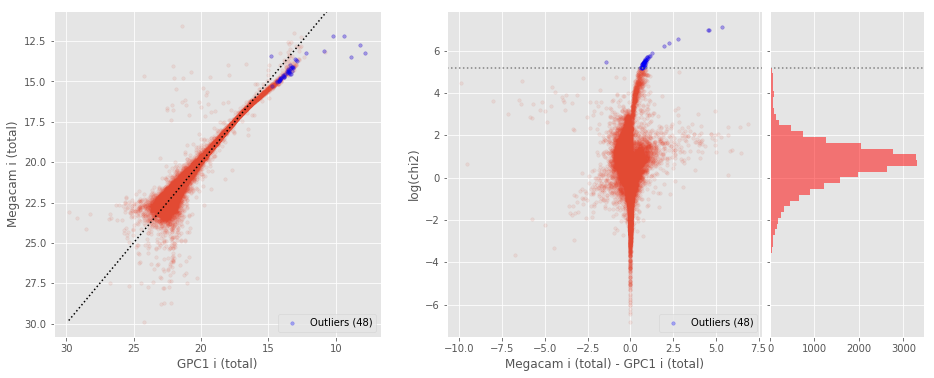

KIDS i (aperture) - GPC1 i (aperture) (27091 sources):
- Median: 0.17
- Median Absolute Deviation: 0.20
- 1% percentile: -1.1682369232177736
- 99% percentile: 1.3024194717407216
Outliers separation: log(chi2) = 5.86
Number of outliers: 0



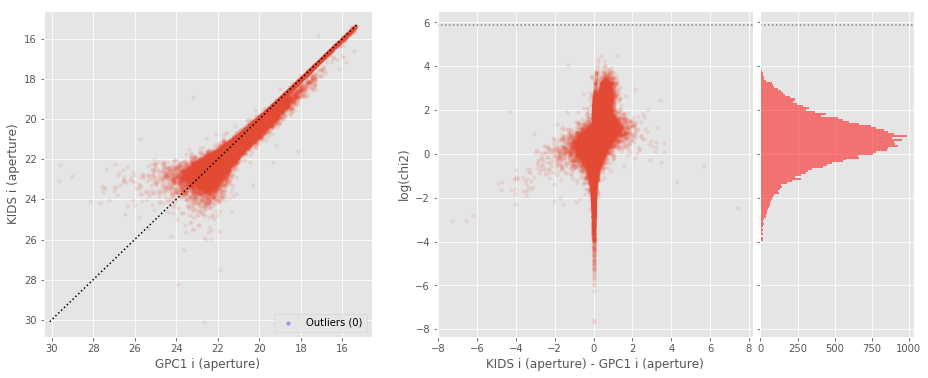

KIDS i (total) - GPC1 i (total) (27059 sources):
- Median: -0.01
- Median Absolute Deviation: 0.14
- 1% percentile: -0.8988835525512695
- 99% percentile: 1.571112136840818
Outliers separation: log(chi2) = 4.67
Number of outliers: 2



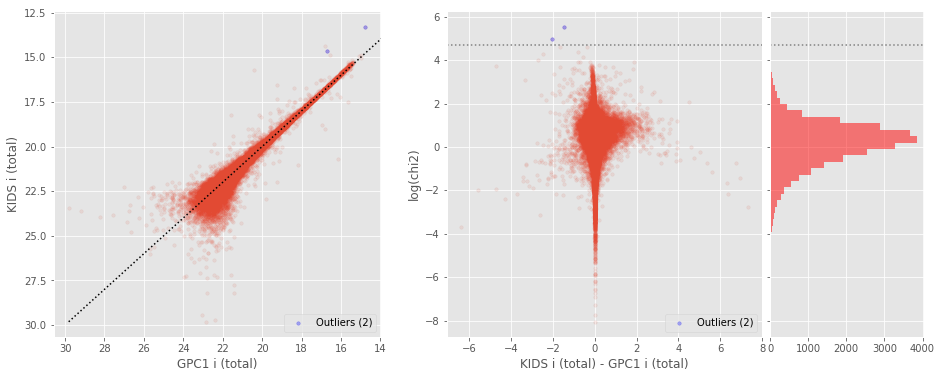

SUPRIME i (aperture) - GPC1 i (aperture) (115399 sources):
- Median: 0.12
- Median Absolute Deviation: 0.23
- 1% percentile: -1.354036407470703
- 99% percentile: 1.6462595367431654
Outliers separation: log(chi2) = 6.24
Number of outliers: 0



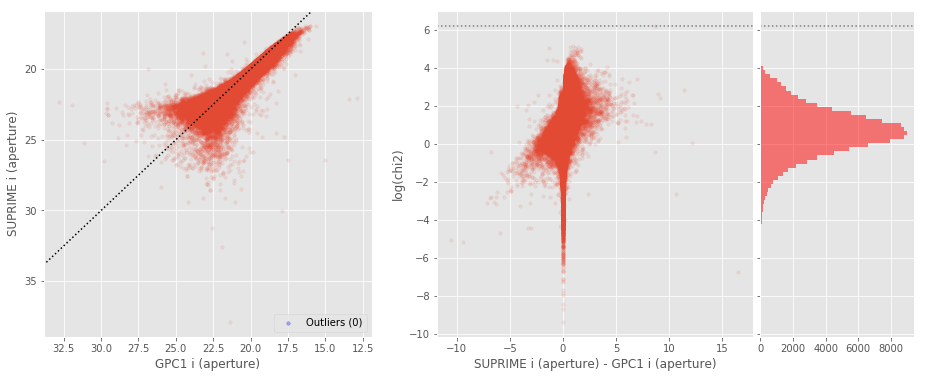

SUPRIME i (total) - GPC1 i (total) (114932 sources):
- Median: -0.18
- Median Absolute Deviation: 0.15
- 1% percentile: -1.070429458618164
- 99% percentile: 1.6534666633605961
Outliers separation: log(chi2) = 5.07
Number of outliers: 6



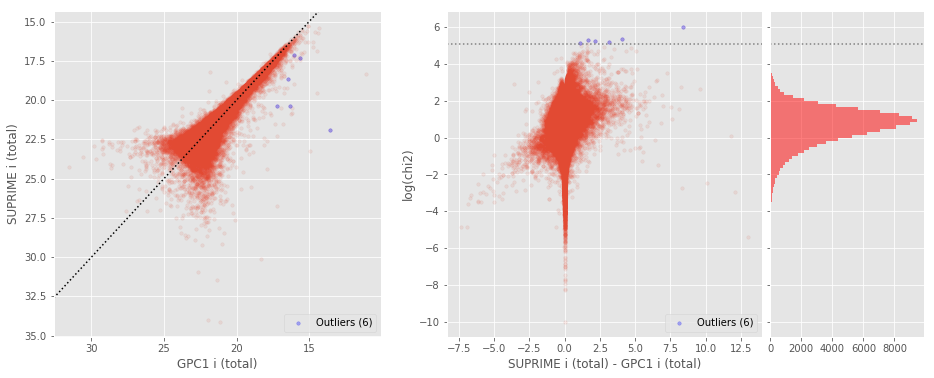

KIDS i (aperture) - Megacam i (aperture) (102331 sources):
- Median: 0.09
- Median Absolute Deviation: 0.23
- 1% percentile: -1.2760149002075196
- 99% percentile: 2.2816679000854485
Outliers separation: log(chi2) = 4.59
Number of outliers: 156



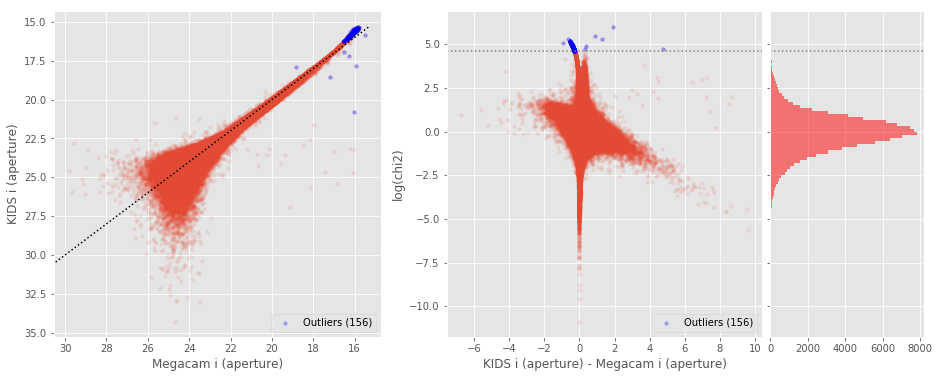

KIDS i (total) - Megacam i (total) (104414 sources):
- Median: 0.31
- Median Absolute Deviation: 0.30
- 1% percentile: -0.9243918991088866
- 99% percentile: 3.371782283782953
Outliers separation: log(chi2) = 4.11
Number of outliers: 232



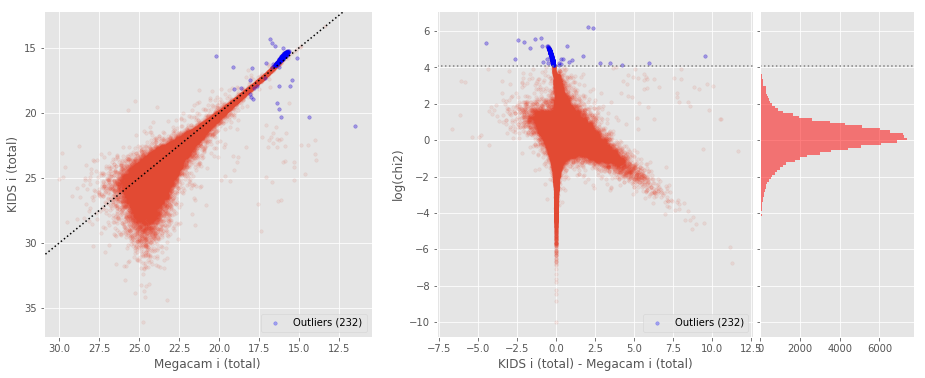

SUPRIME i (aperture) - Megacam i (aperture) (473466 sources):
- Median: -0.02
- Median Absolute Deviation: 0.18
- 1% percentile: -1.6780656814575194
- 99% percentile: 1.7845089912414542
Outliers separation: log(chi2) = 5.04
Number of outliers: 107



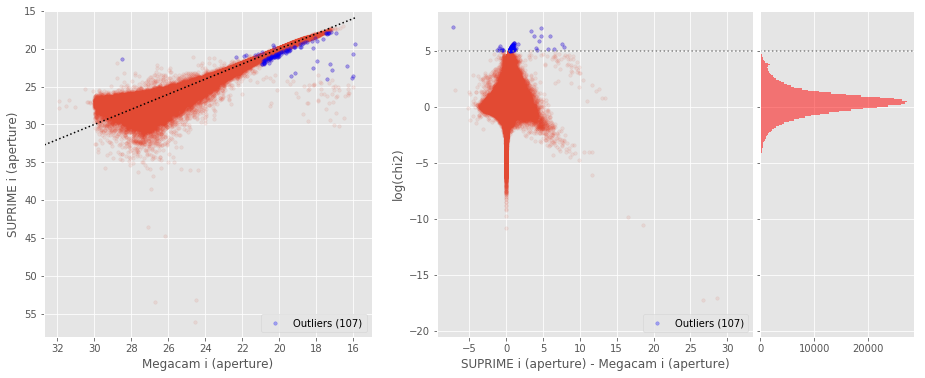

SUPRIME i (total) - Megacam i (total) (439344 sources):
- Median: -0.08
- Median Absolute Deviation: 0.24
- 1% percentile: -2.6804939460754396
- 99% percentile: 2.218547763824466
Outliers separation: log(chi2) = 5.80
Number of outliers: 29



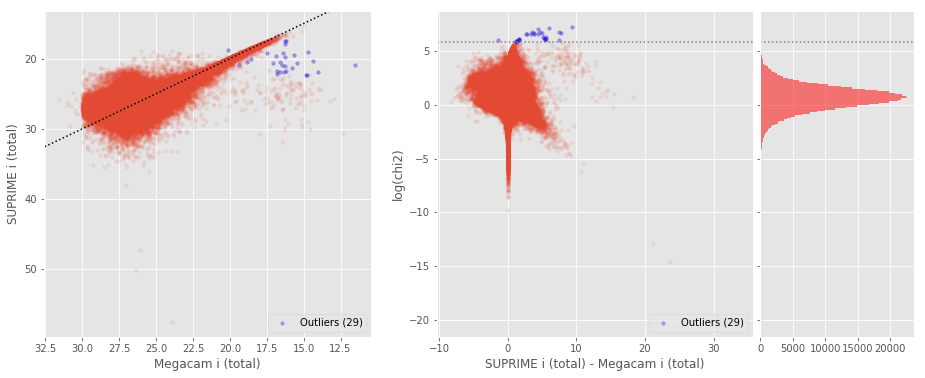

SUPRIME i (aperture) - KIDS i (aperture) (114257 sources):
- Median: -0.06
- Median Absolute Deviation: 0.23
- 1% percentile: -2.2342630004882813
- 99% percentile: 1.456025543212891
Outliers separation: log(chi2) = 4.43
Number of outliers: 39



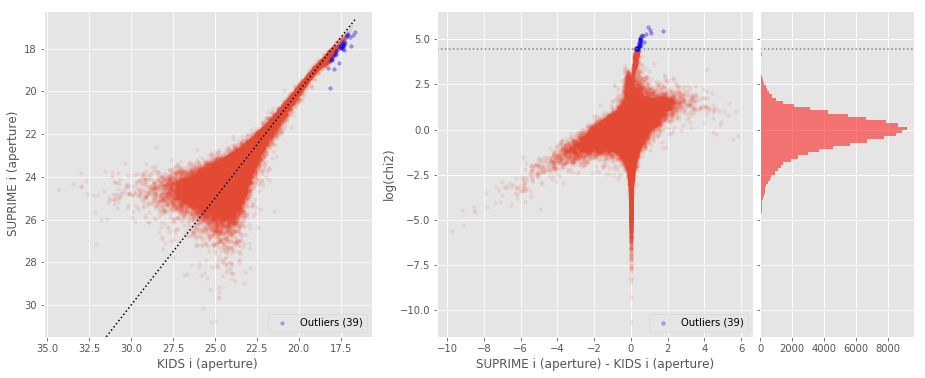

SUPRIME i (total) - KIDS i (total) (116001 sources):
- Median: -0.33
- Median Absolute Deviation: 0.33
- 1% percentile: -3.3811874389648438
- 99% percentile: 1.3634872436523438
Outliers separation: log(chi2) = 4.22
Number of outliers: 35



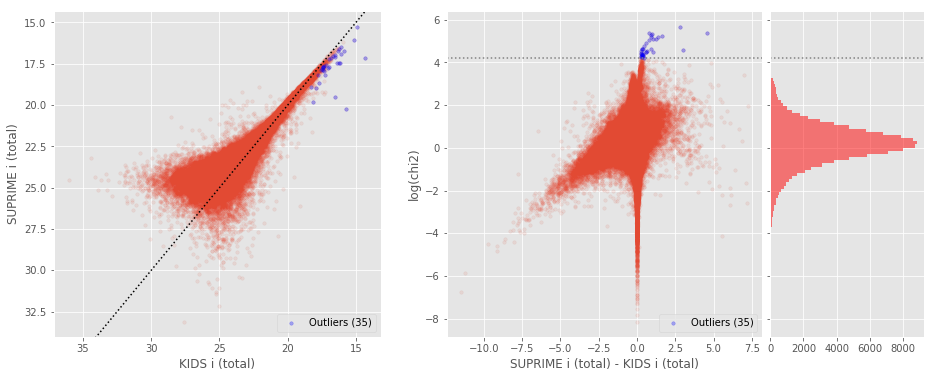

Megacam z (aperture) - GPC1 z (aperture) (25255 sources):
- Median: 0.15
- Median Absolute Deviation: 0.18
- 1% percentile: -1.5847016525268556
- 99% percentile: 1.717768249511718
Outliers separation: log(chi2) = 6.21
Number of outliers: 3



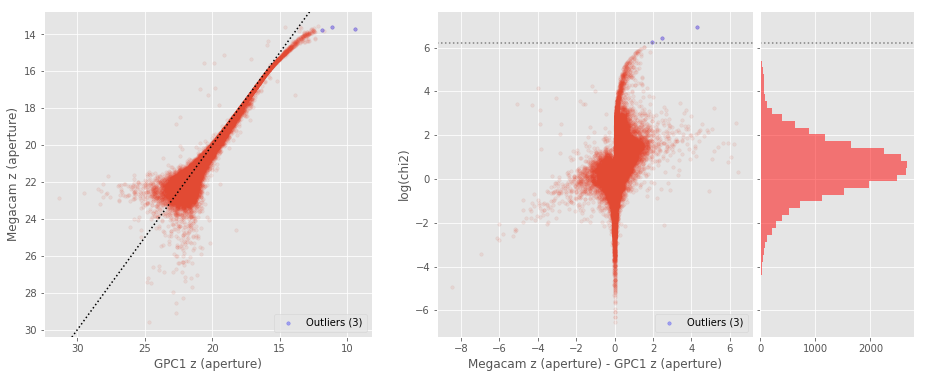

Megacam z (total) - GPC1 z (total) (25199 sources):
- Median: -0.10
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4369090652465821
- 99% percentile: 1.8018976211547872
Outliers separation: log(chi2) = 5.24
Number of outliers: 14



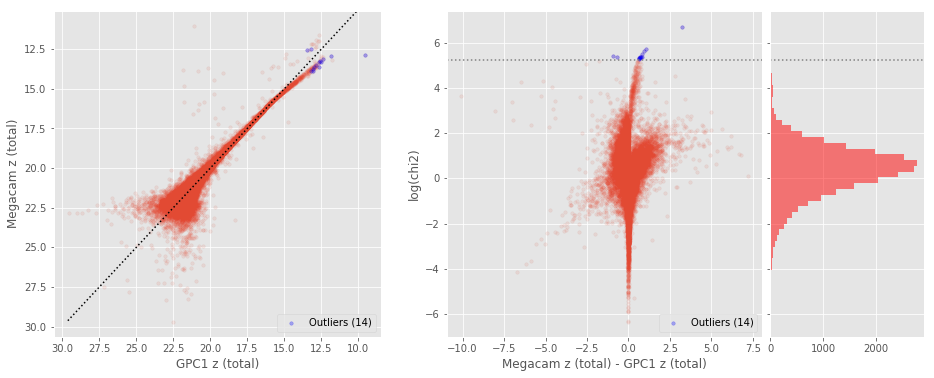

DECam z (aperture) - GPC1 z (aperture) (115390 sources):
- Median: -0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -1.7331287574768068
- 99% percentile: 1.8191763687133795
Outliers separation: log(chi2) = 5.33
Number of outliers: 603



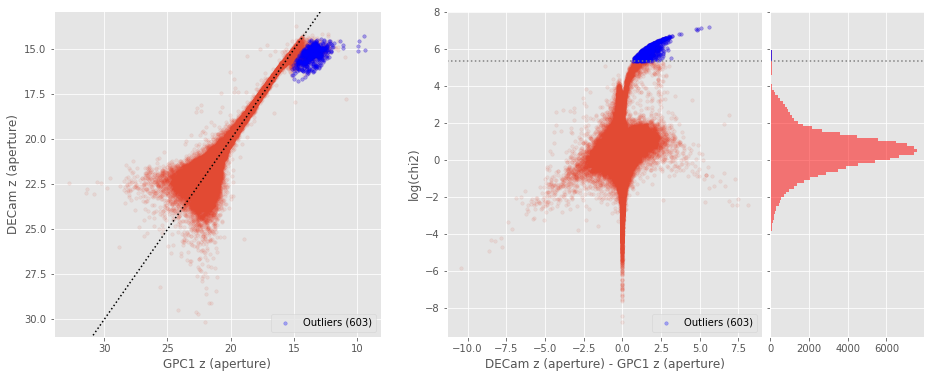

DECam z (total) - GPC1 z (total) (115151 sources):
- Median: -0.23
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5656242370605469
- 99% percentile: 1.7236251831054688
Outliers separation: log(chi2) = 6.15
Number of outliers: 6



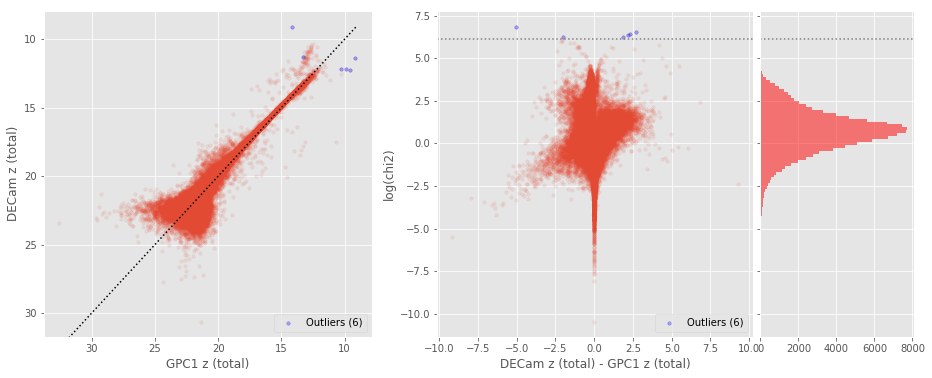

SUPRIME z (aperture) - GPC1 z (aperture) (114132 sources):
- Median: 0.13
- Median Absolute Deviation: 0.26
- 1% percentile: -1.6669421386718752
- 99% percentile: 5.630905418395996
Outliers separation: log(chi2) = 6.01
Number of outliers: 0



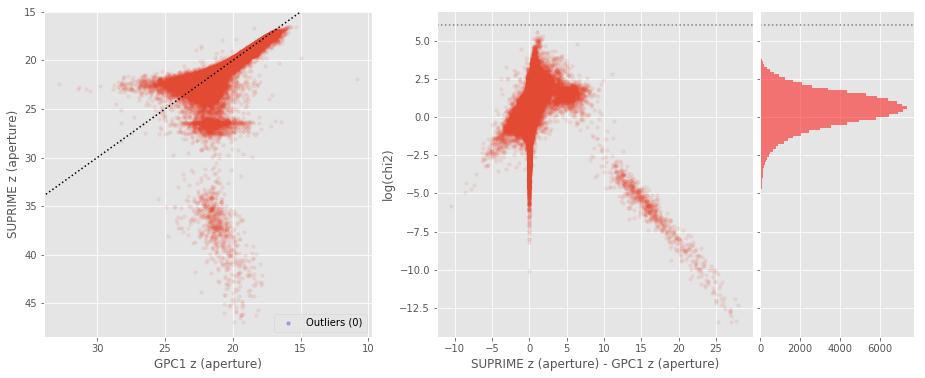

SUPRIME z (total) - GPC1 z (total) (113328 sources):
- Median: -0.19
- Median Absolute Deviation: 0.18
- 1% percentile: -1.4522499465942382
- 99% percentile: 5.051815567016583
Outliers separation: log(chi2) = 5.47
Number of outliers: 0



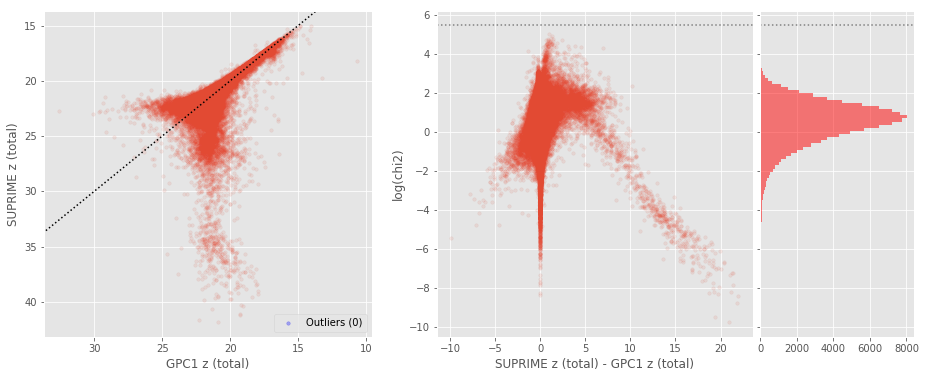

DECam z (aperture) - Megacam z (aperture) (80662 sources):
- Median: -0.19
- Median Absolute Deviation: 0.20
- 1% percentile: -1.098313808441162
- 99% percentile: 2.6549689674377435
Outliers separation: log(chi2) = 7.29
Number of outliers: 0



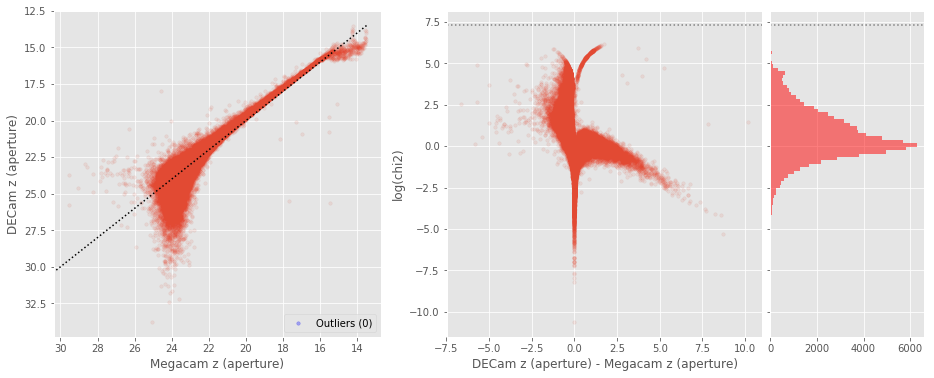

DECam z (total) - Megacam z (total) (84368 sources):
- Median: -0.02
- Median Absolute Deviation: 0.17
- 1% percentile: -0.8687724113464355
- 99% percentile: 1.4678274726867706
Outliers separation: log(chi2) = 5.53
Number of outliers: 36



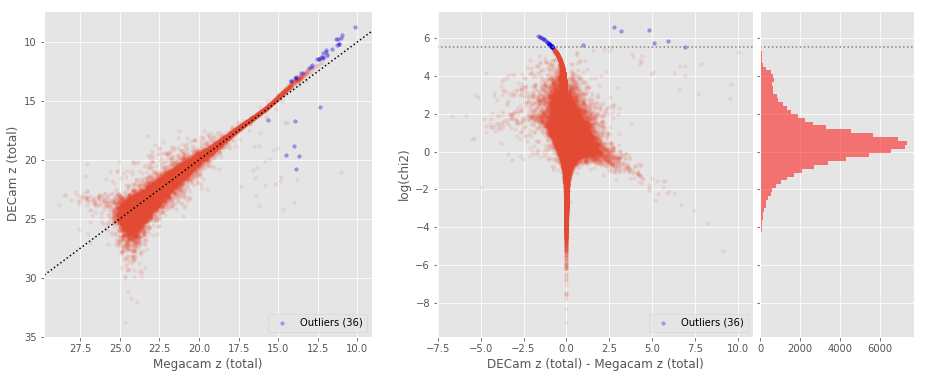

SUPRIME z (aperture) - Megacam z (aperture) (441213 sources):
- Median: -0.07
- Median Absolute Deviation: 0.23
- 1% percentile: -2.3424002838134763
- 99% percentile: 2.1602096557617196
Outliers separation: log(chi2) = 5.03
Number of outliers: 66



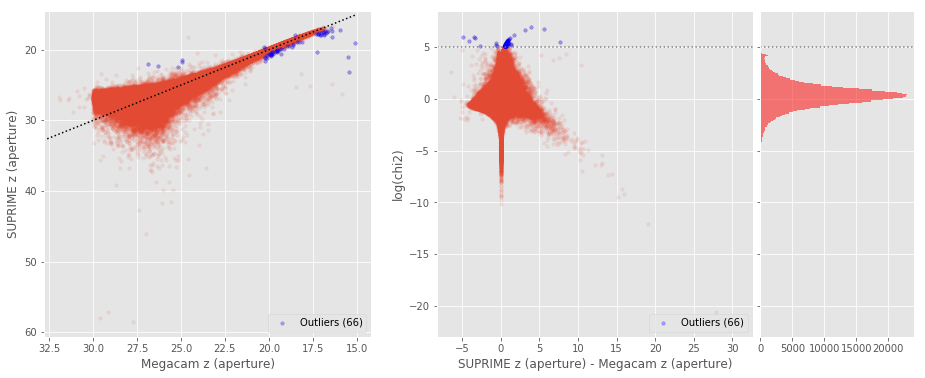

SUPRIME z (total) - Megacam z (total) (409772 sources):
- Median: -0.13
- Median Absolute Deviation: 0.29
- 1% percentile: -3.05764253616333
- 99% percentile: 2.374461460113518
Outliers separation: log(chi2) = 5.71
Number of outliers: 19



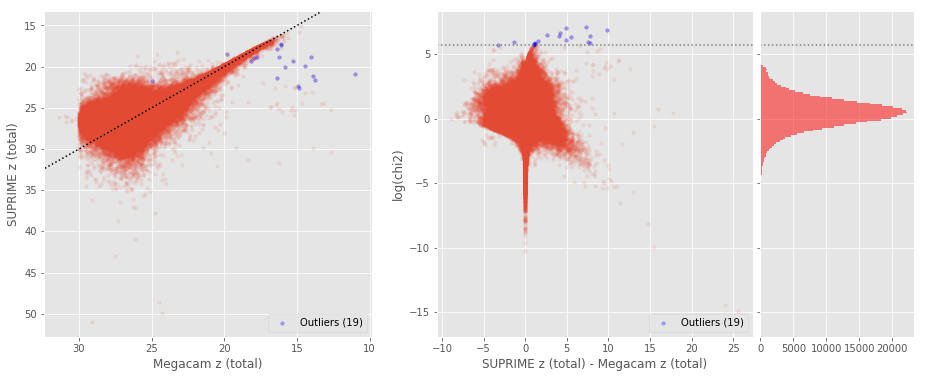

SUPRIME z (aperture) - DECam z (aperture) (338583 sources):
- Median: 0.12
- Median Absolute Deviation: 0.25
- 1% percentile: -2.5005575561523434
- 99% percentile: 4.762694587707514
Outliers separation: log(chi2) = 6.49
Number of outliers: 0



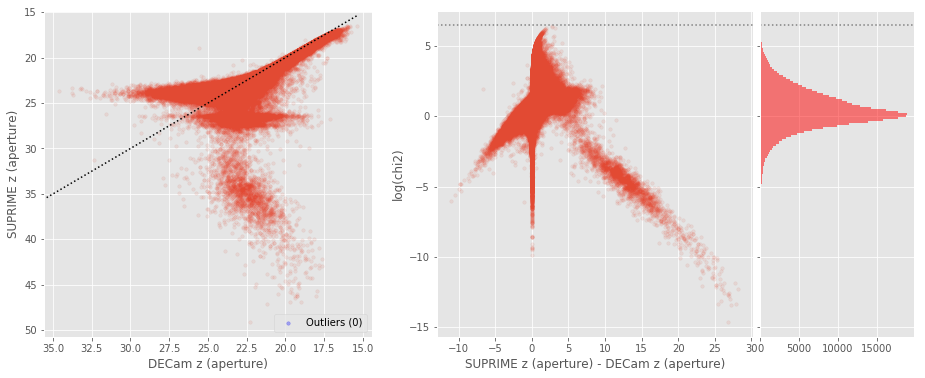

SUPRIME z (total) - DECam z (total) (349028 sources):
- Median: -0.06
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4440815925598145
- 99% percentile: 3.9324228668212875
Outliers separation: log(chi2) = 4.77
Number of outliers: 524



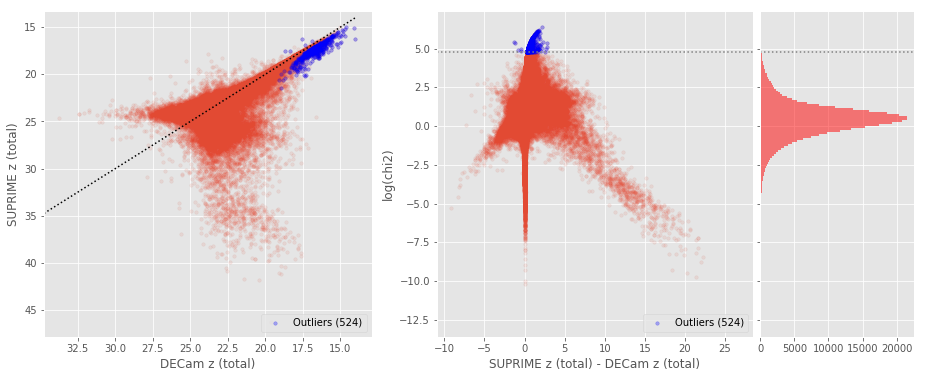

SUPRIME y (aperture) - GPC1 y (aperture) (110180 sources):
- Median: 0.36
- Median Absolute Deviation: 0.40
- 1% percentile: -1.899928321838379
- 99% percentile: 4.261415328979457
Outliers separation: log(chi2) = 6.20
Number of outliers: 0



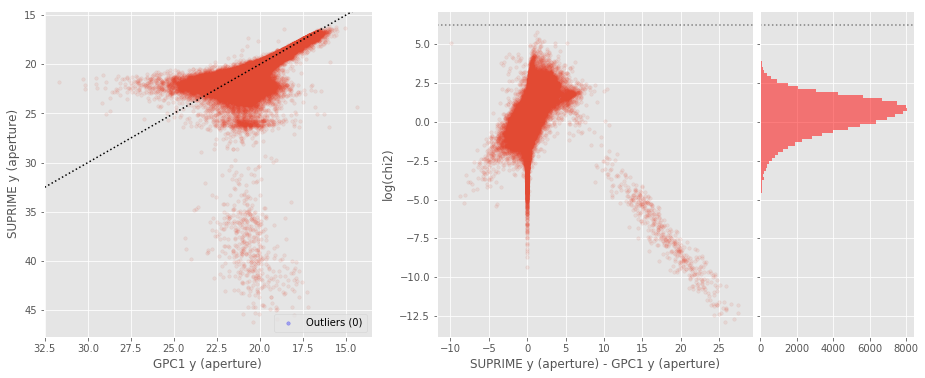

SUPRIME y (total) - GPC1 y (total) (107636 sources):
- Median: 0.04
- Median Absolute Deviation: 0.41
- 1% percentile: -1.9863888740539553
- 99% percentile: 4.285578727722167
Outliers separation: log(chi2) = 5.82
Number of outliers: 0



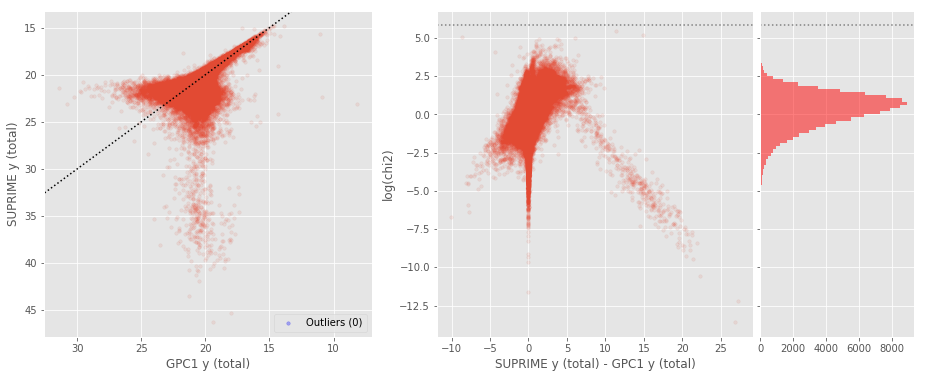

UKIDSS Y (aperture) - GPC1 y (aperture) (38700 sources):
- Median: 0.15
- Median Absolute Deviation: 0.22
- 1% percentile: -0.9580776023864745
- 99% percentile: 1.5511794948577935
Outliers separation: log(chi2) = 5.11
Number of outliers: 25



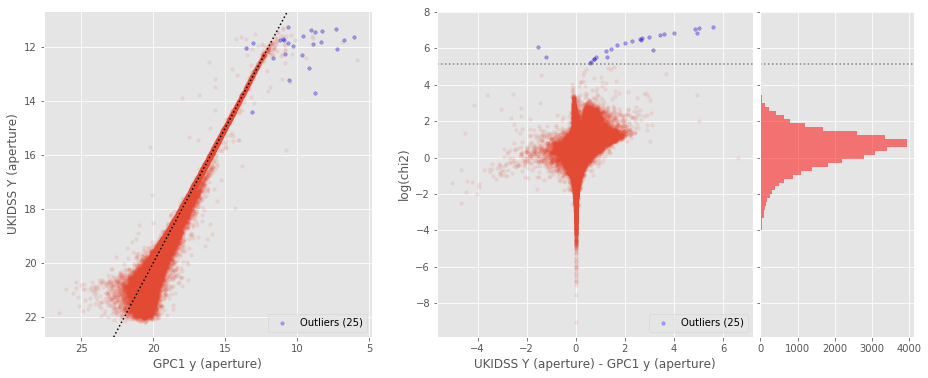

UKIDSS Y (total) - GPC1 y (total) (38607 sources):
- Median: -0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1509109115600586
- 99% percentile: 1.3760128784179737
Outliers separation: log(chi2) = 4.94
Number of outliers: 26



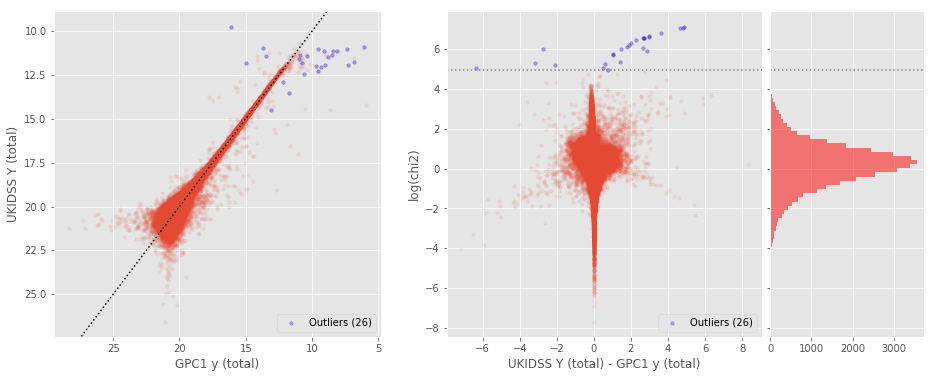

UKIDSS Y (aperture) - SUPRIME y (aperture) (33828 sources):
- Median: 0.06
- Median Absolute Deviation: 0.10
- 1% percentile: -5.11232048034668
- 99% percentile: 0.9664893722534216
Outliers separation: log(chi2) = 4.09
Number of outliers: 44



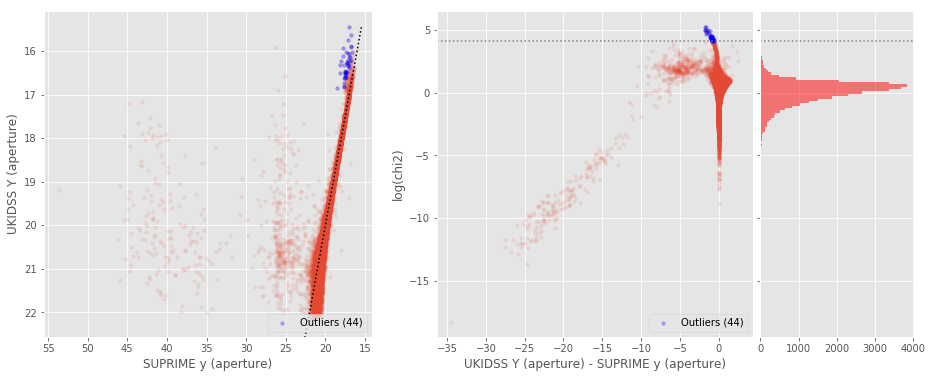

UKIDSS Y (total) - SUPRIME y (total) (33740 sources):
- Median: 0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -4.5861250686645505
- 99% percentile: 1.1050808334350601
Outliers separation: log(chi2) = 4.37
Number of outliers: 13



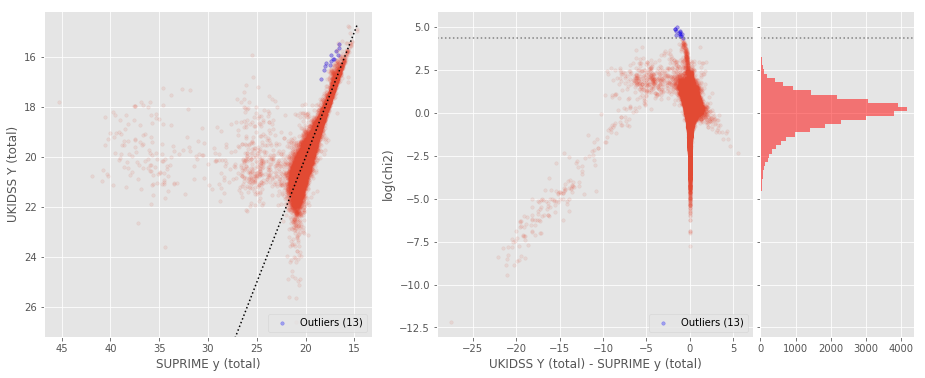

WIRCAM J (aperture) - UKIDSS J (aperture) (7625 sources):
- Median: 0.13
- Median Absolute Deviation: 0.06
- 1% percentile: -0.3132859039306641
- 99% percentile: 0.7827103424072321
Outliers separation: log(chi2) = 6.99
Number of outliers: 0



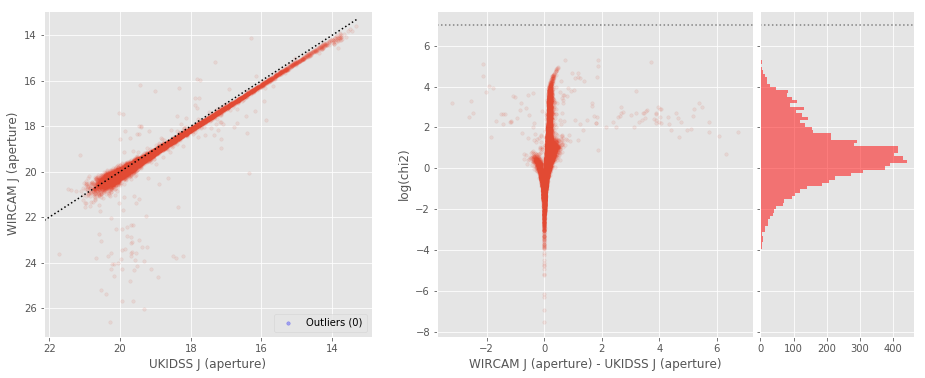

WIRCAM J (total) - UKIDSS J (total) (7631 sources):
- Median: -0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -1.035763931274414
- 99% percentile: 0.5125131607055637
Outliers separation: log(chi2) = 4.88
Number of outliers: 3



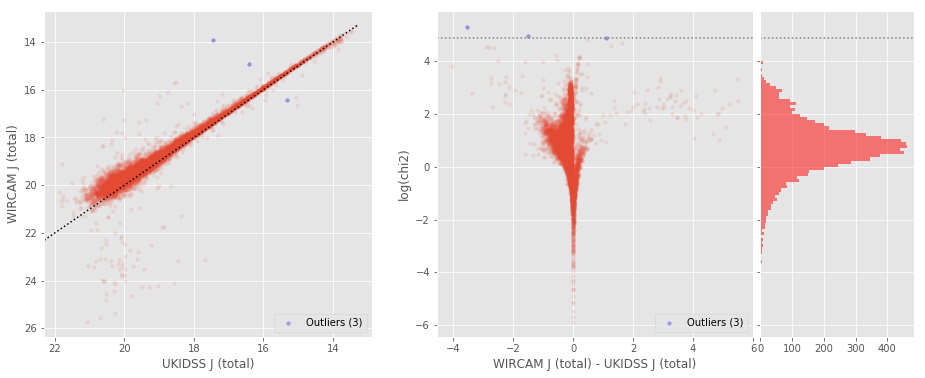

WIRCAM H (aperture) - UKIDSS H (aperture) (10345 sources):
- Median: 0.08
- Median Absolute Deviation: 0.07
- 1% percentile: -0.30047073364257815
- 99% percentile: 0.6181967926025361
Outliers separation: log(chi2) = 5.26
Number of outliers: 3



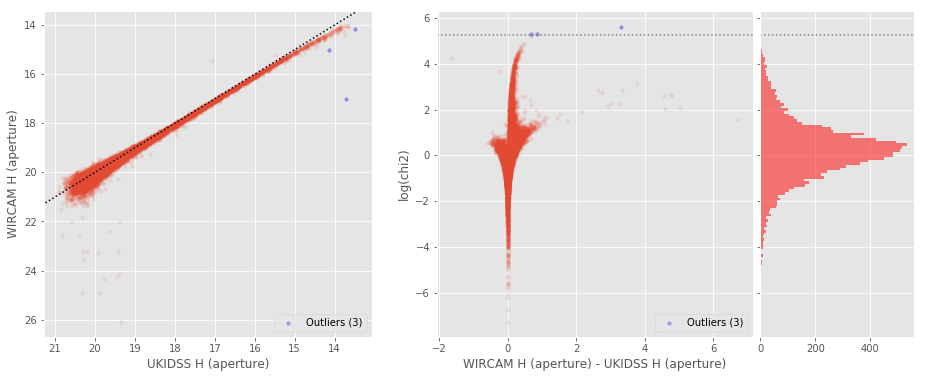

WIRCAM H (total) - UKIDSS H (total) (10338 sources):
- Median: -0.14
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2184893798828125
- 99% percentile: 0.8220537948608371
Outliers separation: log(chi2) = 5.15
Number of outliers: 1



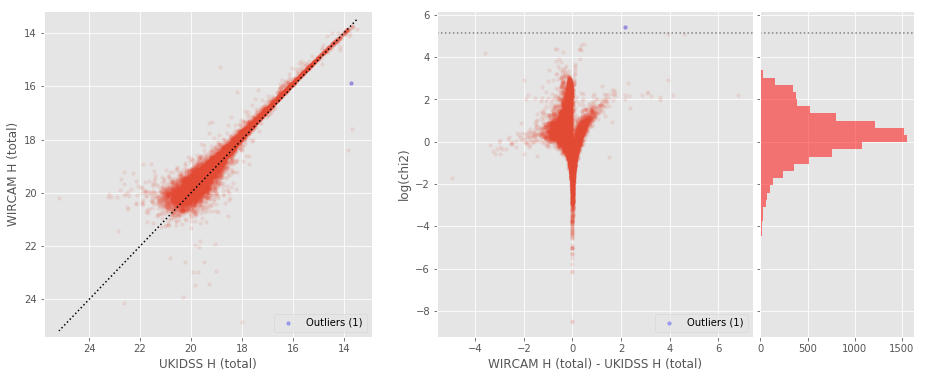

WIRCAM Ks (aperture) - UKIDSS K (aperture) (11598 sources):
- Median: 0.07
- Median Absolute Deviation: 0.07
- 1% percentile: -0.2794716262817383
- 99% percentile: 0.6561705589294448
Outliers separation: log(chi2) = 4.74
Number of outliers: 0



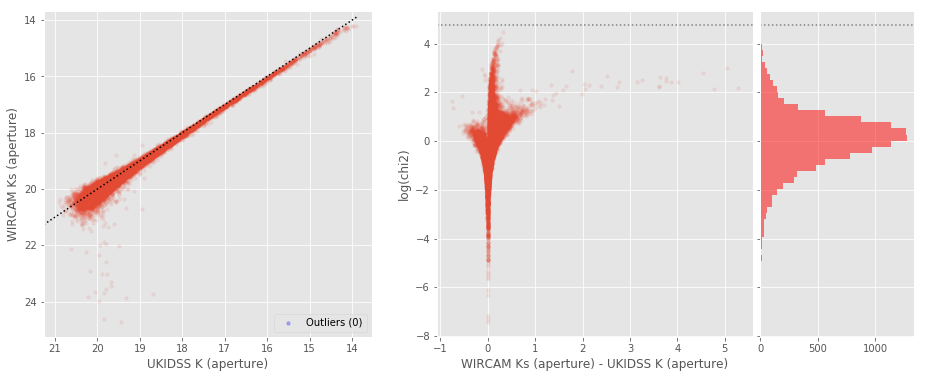

WIRCAM Ks (total) - UKIDSS K (total) (11590 sources):
- Median: -0.13
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1655132293701171
- 99% percentile: 0.8856074905395547
Outliers separation: log(chi2) = 4.74
Number of outliers: 0



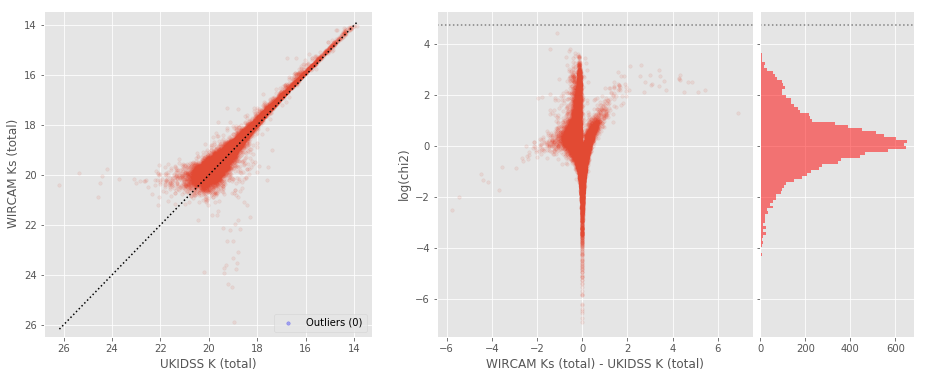

In [33]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "decam_g" and basecol2 == "gpc1_g":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
plt.close() 
plt.close()
plt.close()

## 4/ Aperture correction issues

In [34]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

KIDS u (aperture) - Megacam u (aperture):
800


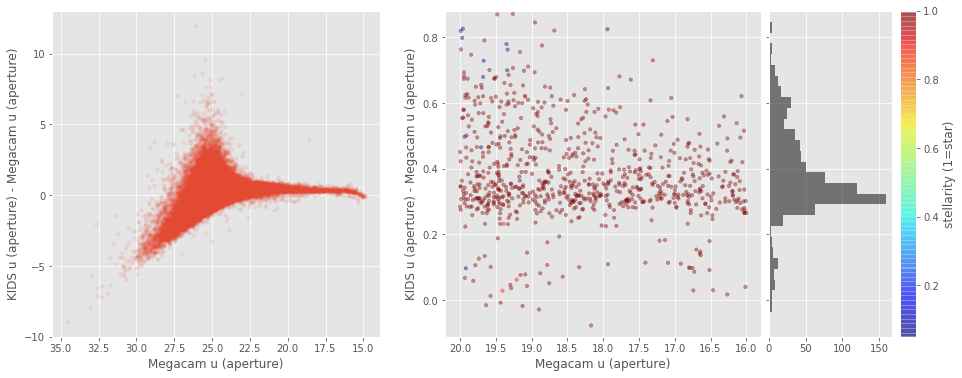

Megacam g (aperture) - GPC1 g (aperture):
1726


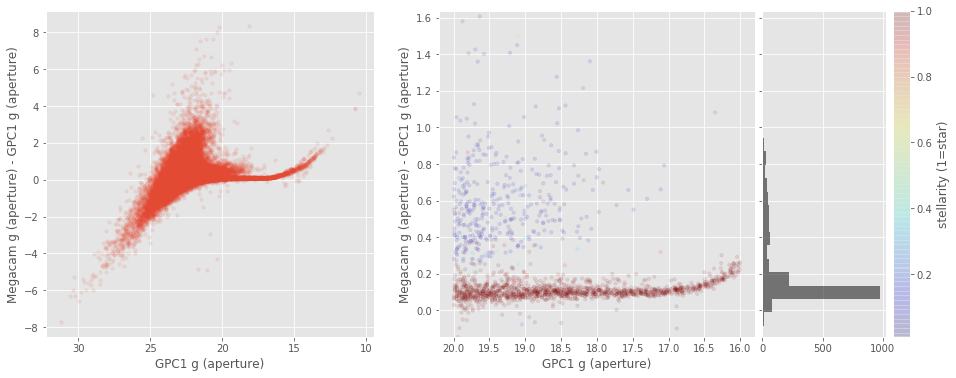

DECam g (aperture) - GPC1 g (aperture):
8227


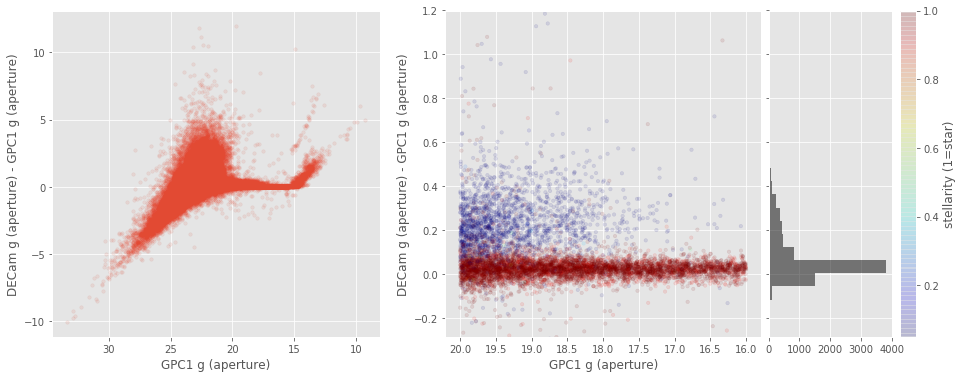

KIDS g (aperture) - GPC1 g (aperture):
1901


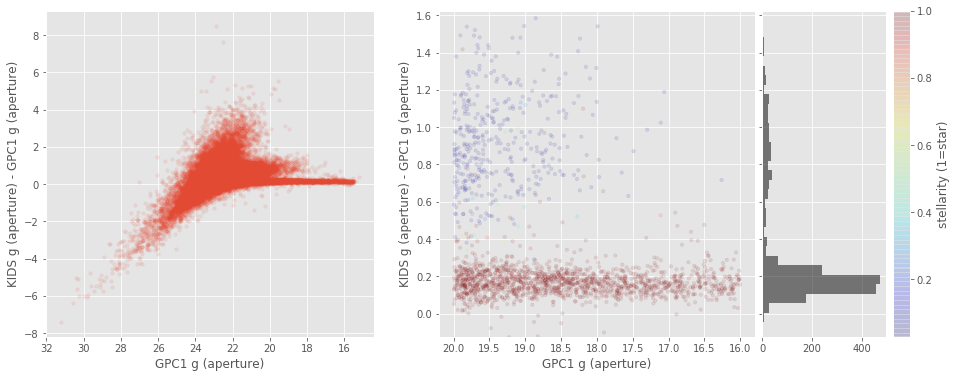

SUPRIME g (aperture) - GPC1 g (aperture):
3857


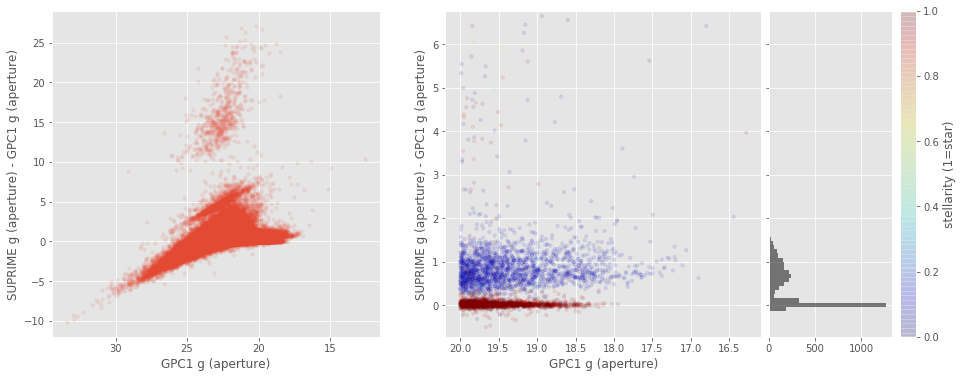

DECam g (aperture) - Megacam g (aperture):
1509


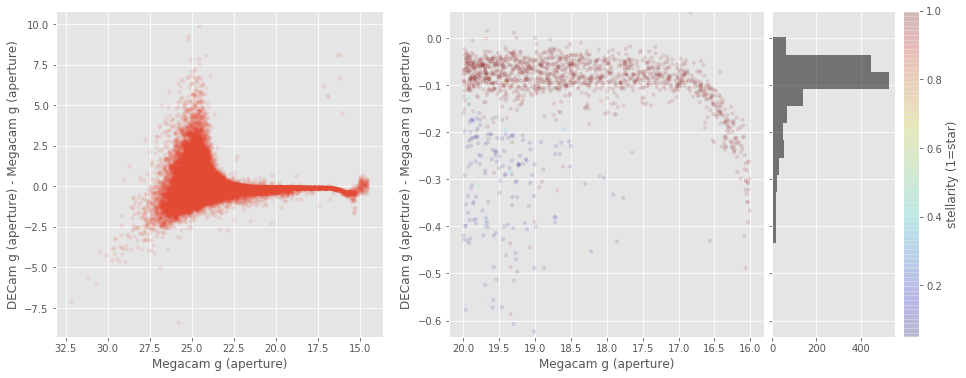

KIDS g (aperture) - Megacam g (aperture):
1499


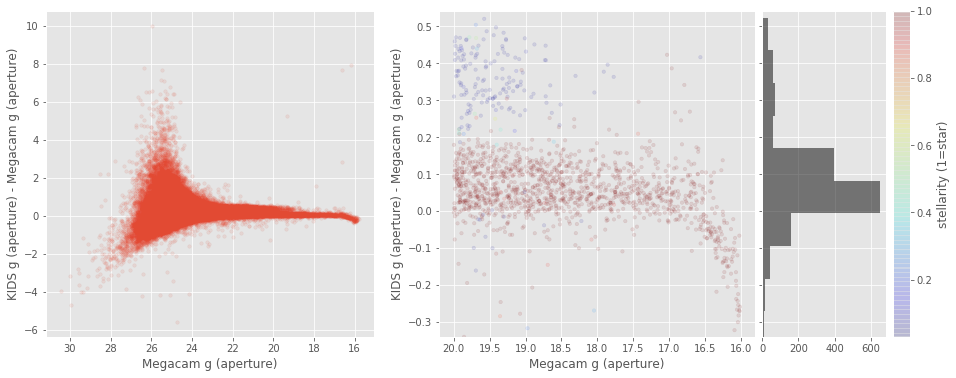

SUPRIME g (aperture) - Megacam g (aperture):
543


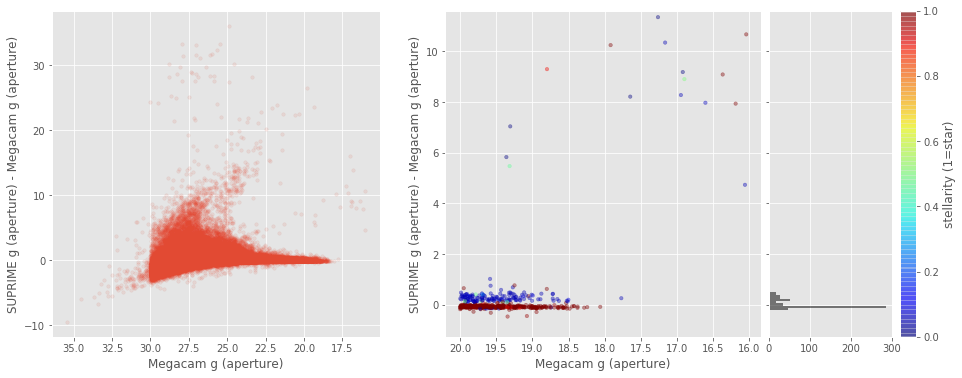

KIDS g (aperture) - DECam g (aperture):
1762


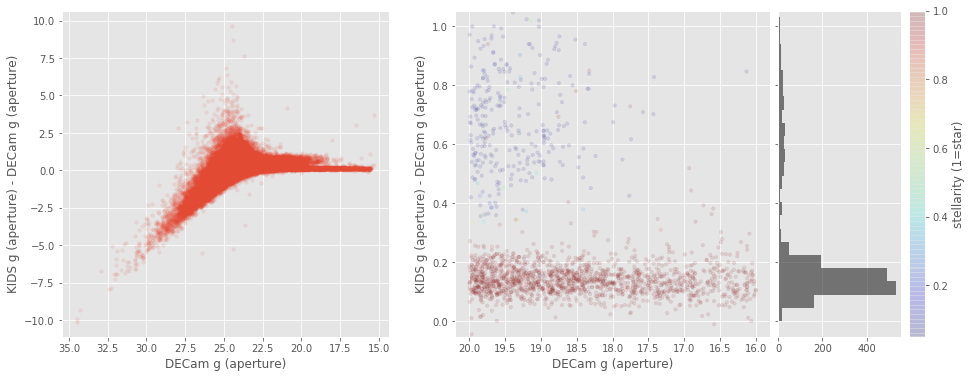

SUPRIME g (aperture) - DECam g (aperture):
3144


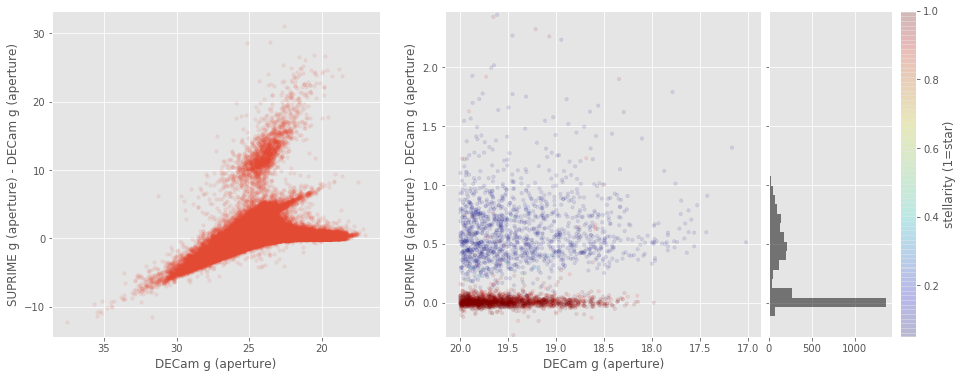

SUPRIME g (aperture) - KIDS g (aperture):
488


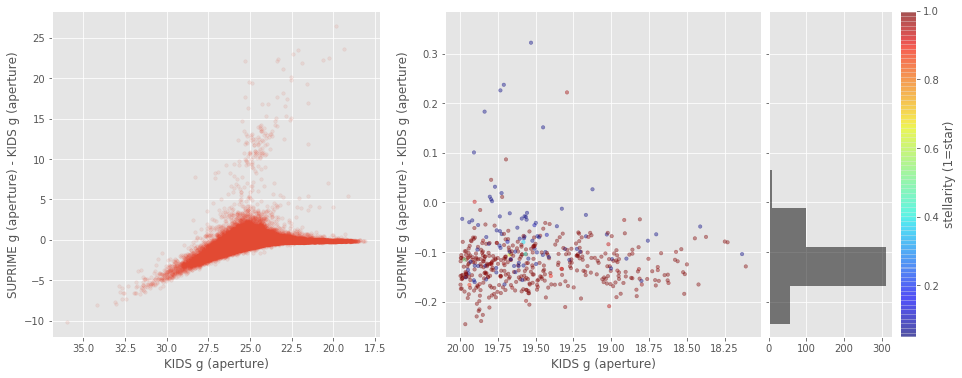

Megacam r (aperture) - GPC1 r (aperture):
2926


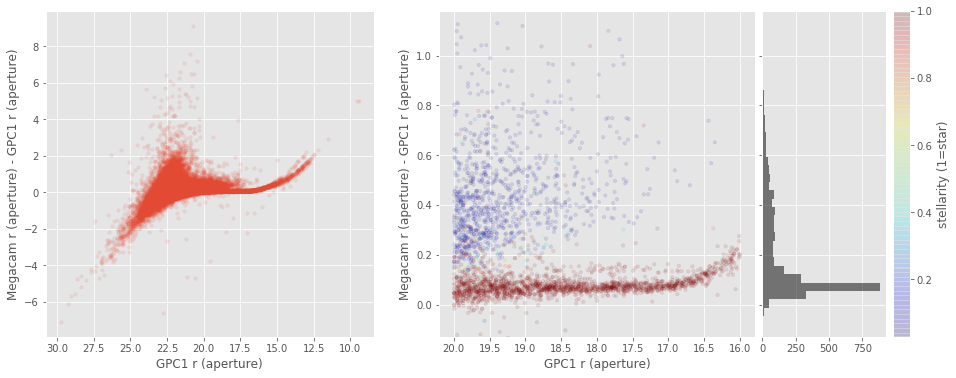

DECam r (aperture) - GPC1 r (aperture):
13593


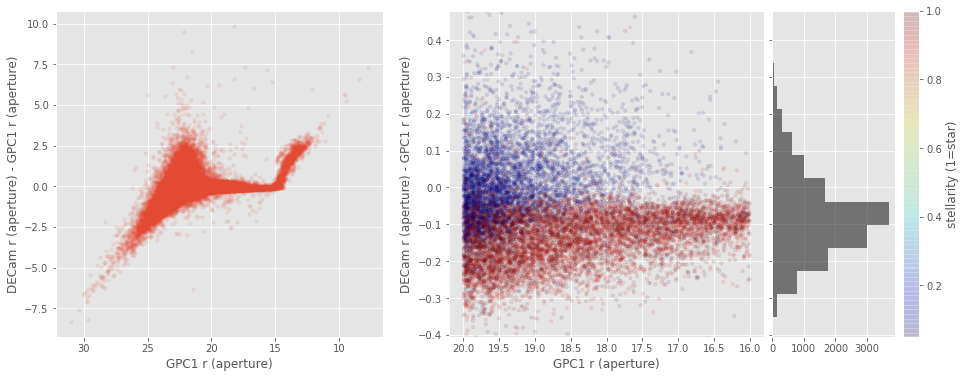

KIDS r (aperture) - GPC1 r (aperture):
2786


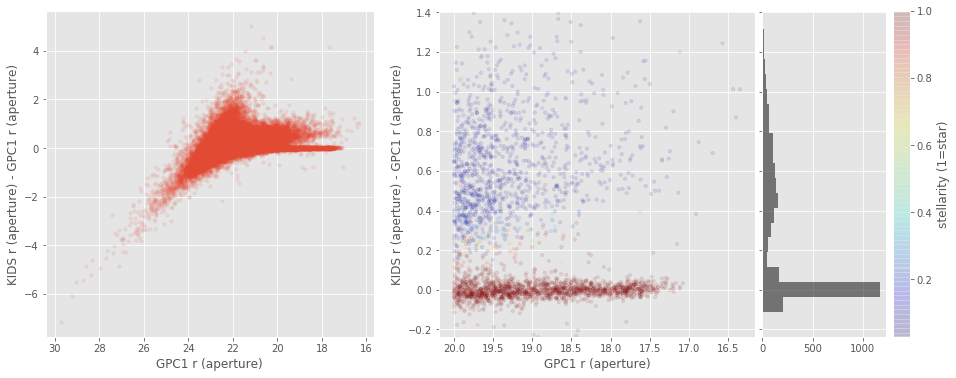

SUPRIME r (aperture) - GPC1 r (aperture):
9501


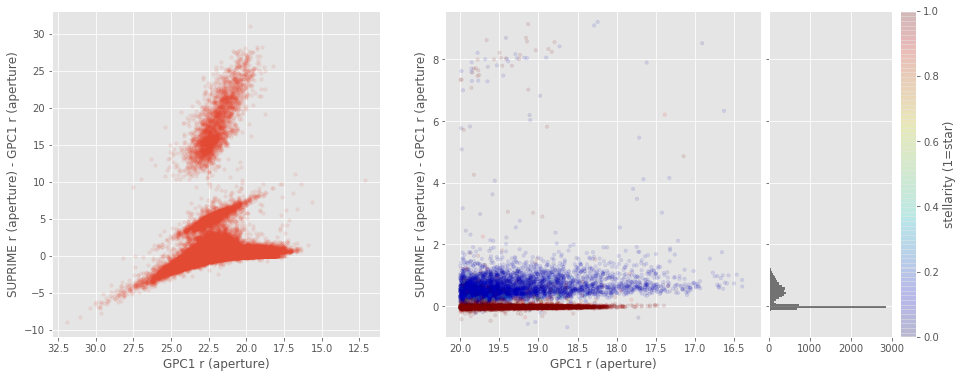

DECam r (aperture) - Megacam r (aperture):
2474


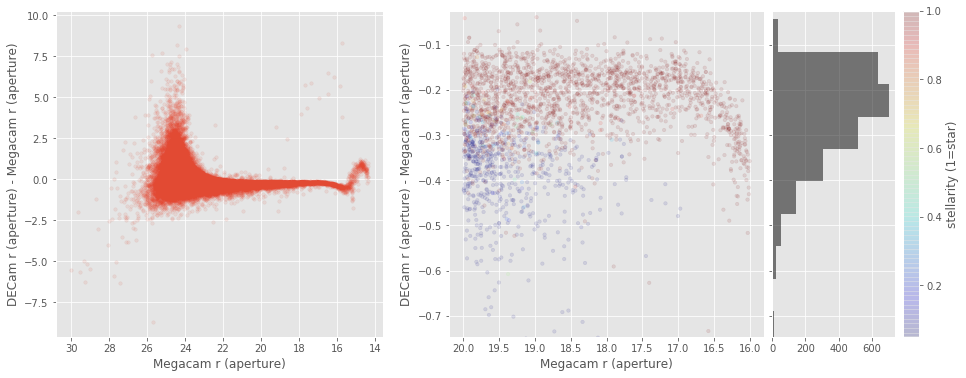

KIDS r (aperture) - Megacam r (aperture):
1990


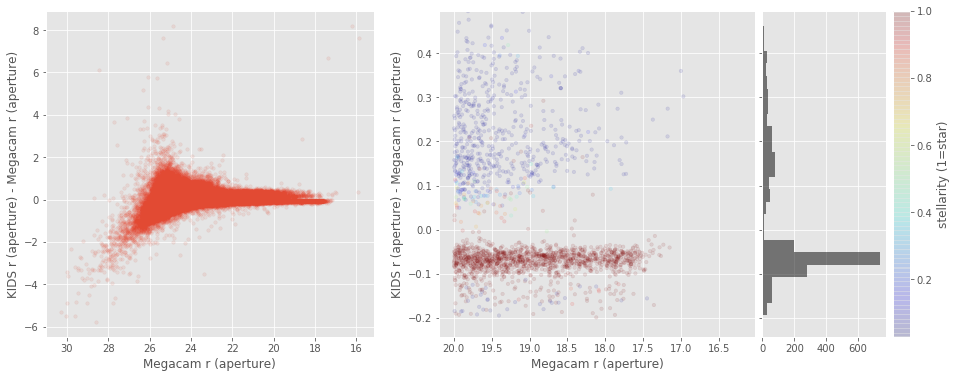

SUPRIME r (aperture) - Megacam r (aperture):
1501


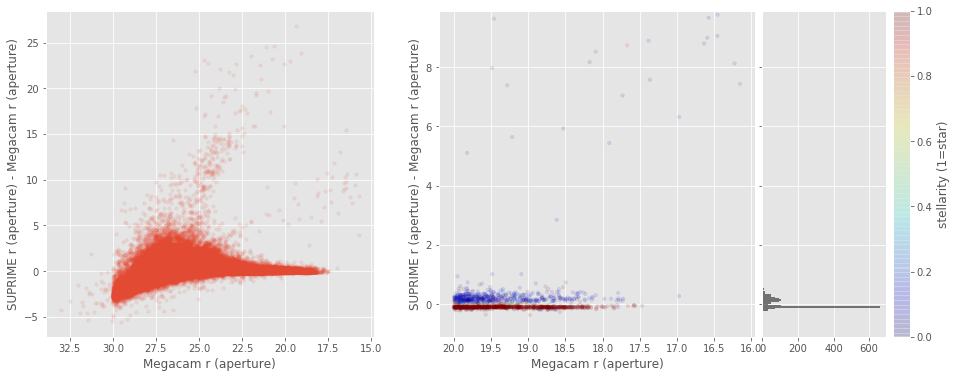

KIDS r (aperture) - DECam r (aperture):
2942


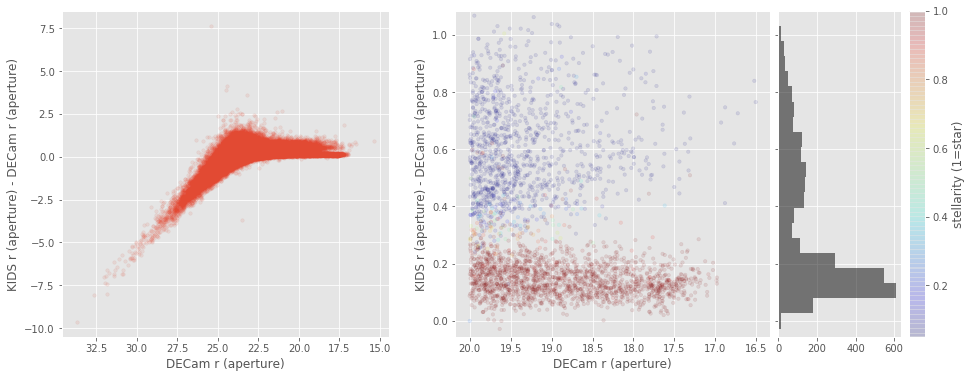

SUPRIME r (aperture) - DECam r (aperture):
9790


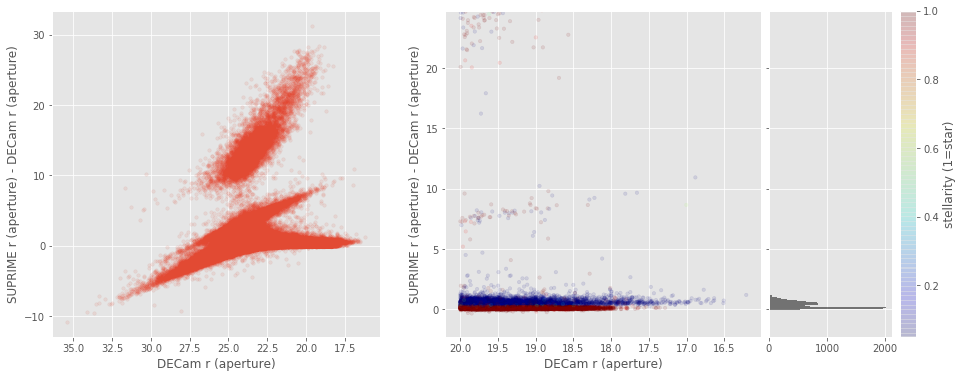

SUPRIME r (aperture) - KIDS r (aperture):
1562


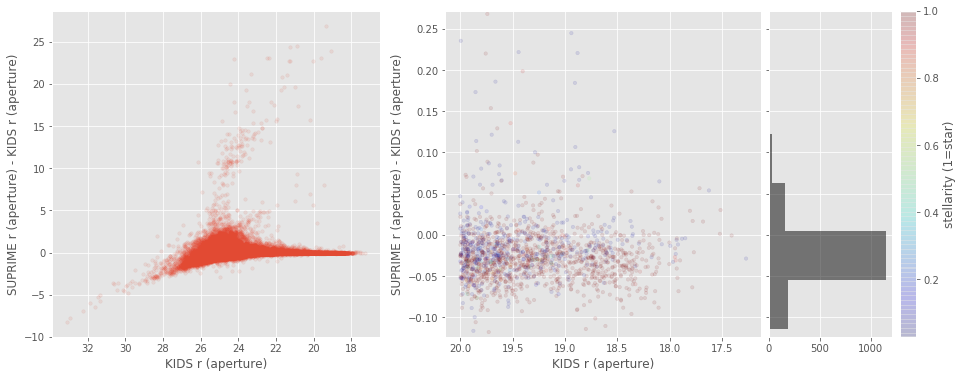

Megacam i (aperture) - GPC1 i (aperture):
4276


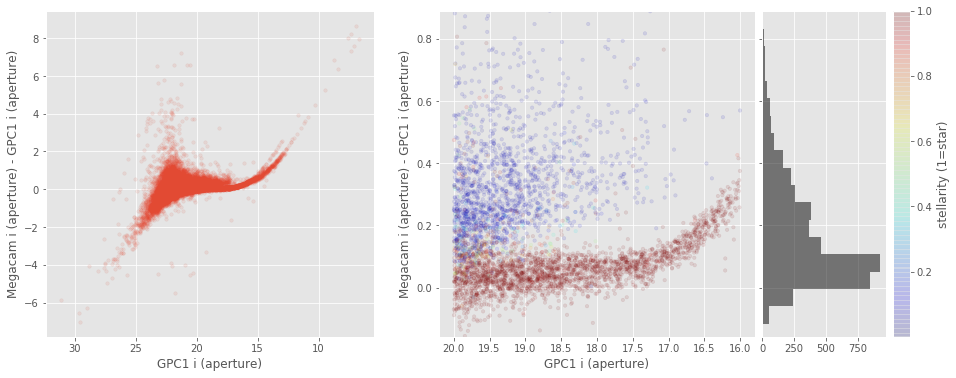

KIDS i (aperture) - GPC1 i (aperture):
4680


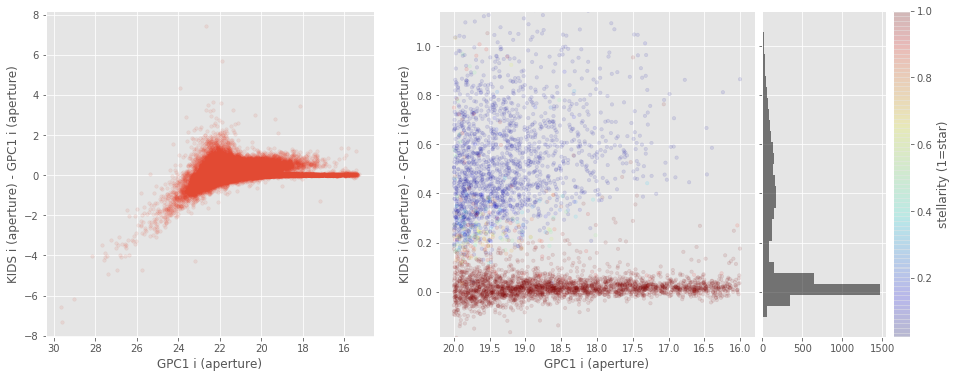

SUPRIME i (aperture) - GPC1 i (aperture):
16767


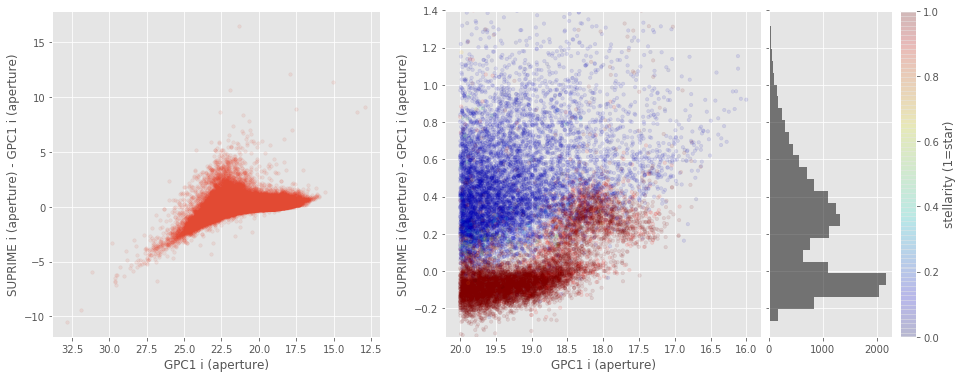

KIDS i (aperture) - Megacam i (aperture):
3832


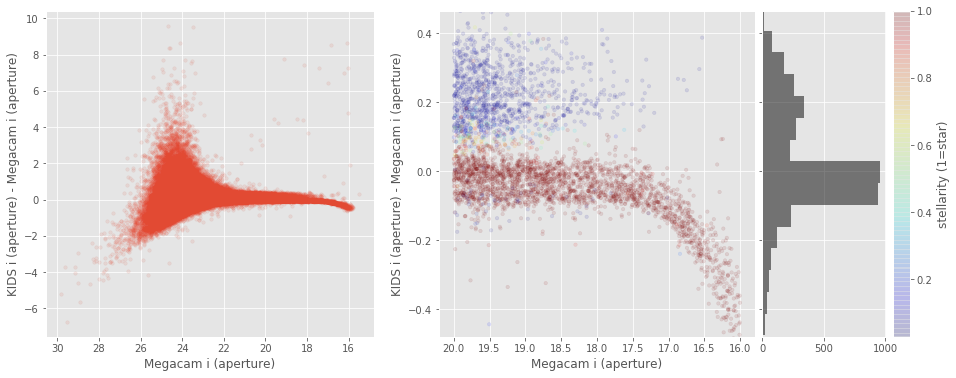

SUPRIME i (aperture) - Megacam i (aperture):
2950


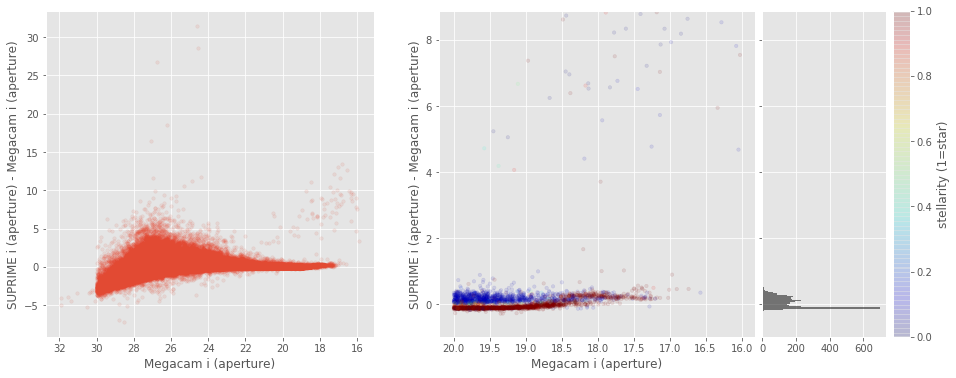

SUPRIME i (aperture) - KIDS i (aperture):
2938


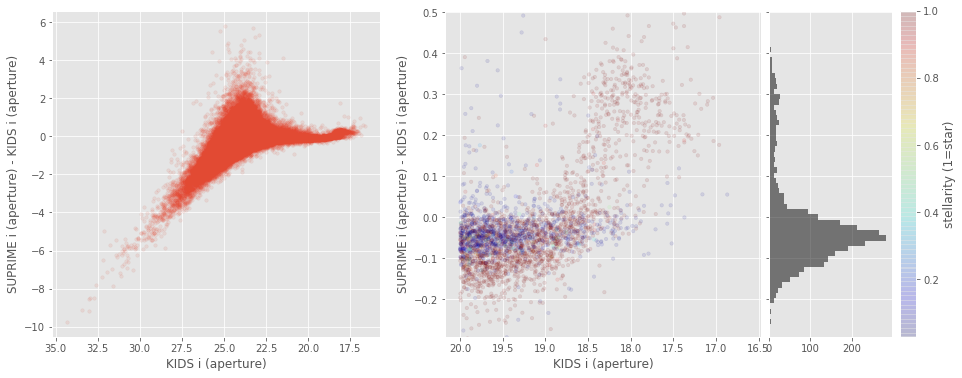

Megacam z (aperture) - GPC1 z (aperture):
5402


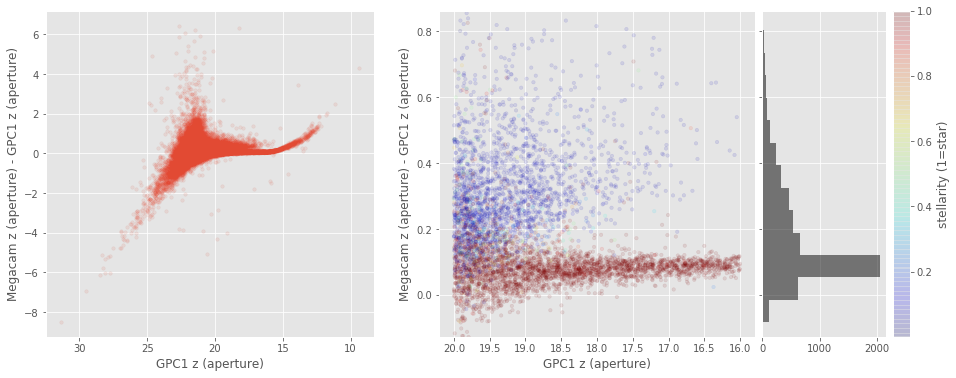

DECam z (aperture) - GPC1 z (aperture):
25073


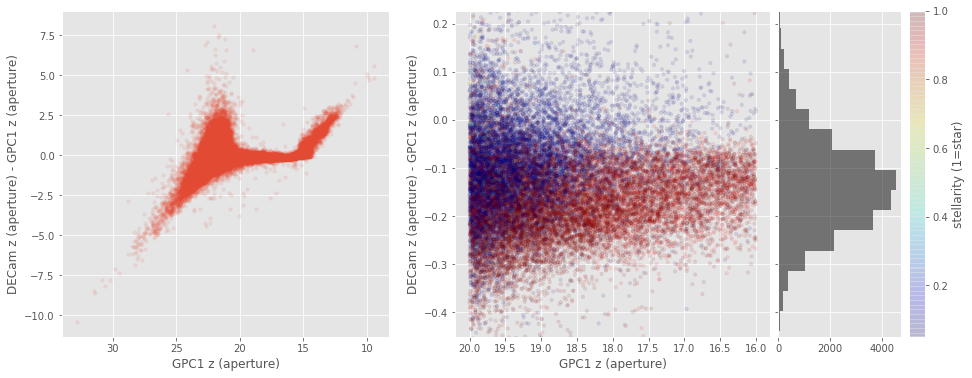

SUPRIME z (aperture) - GPC1 z (aperture):
21917


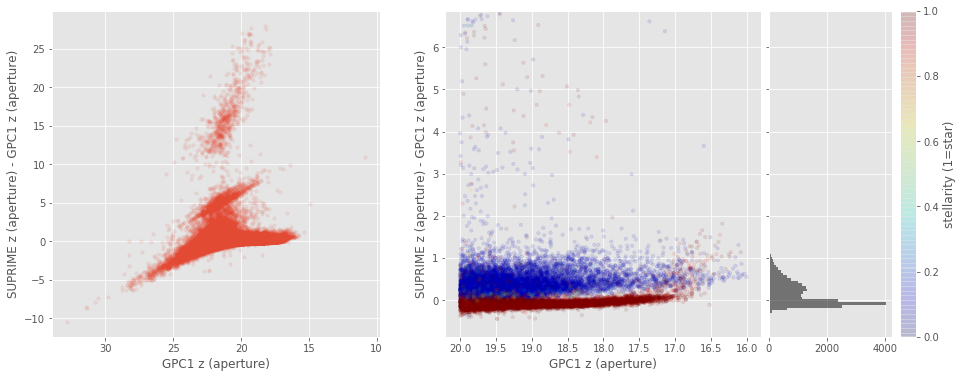

DECam z (aperture) - Megacam z (aperture):
4674


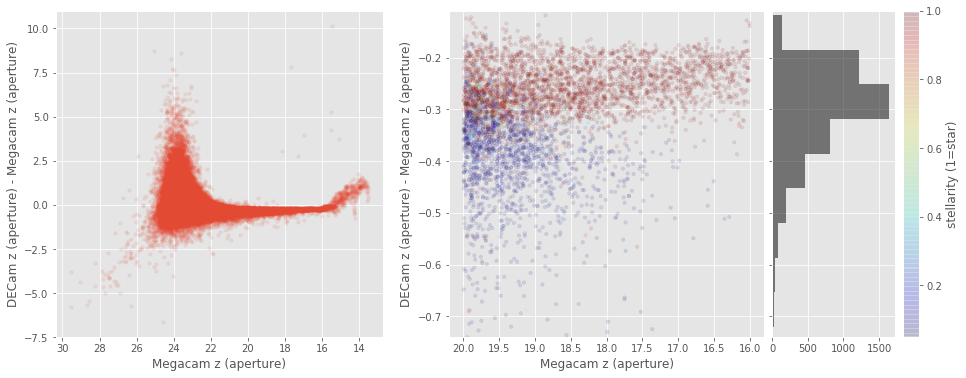

SUPRIME z (aperture) - Megacam z (aperture):
3858


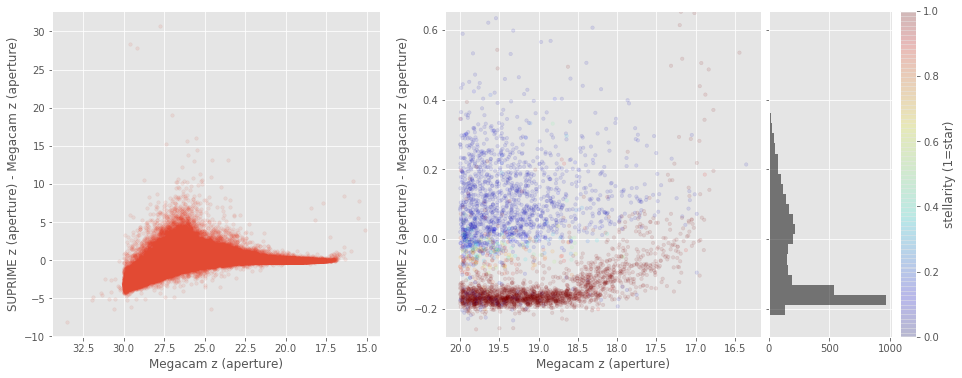

SUPRIME z (aperture) - DECam z (aperture):
23938


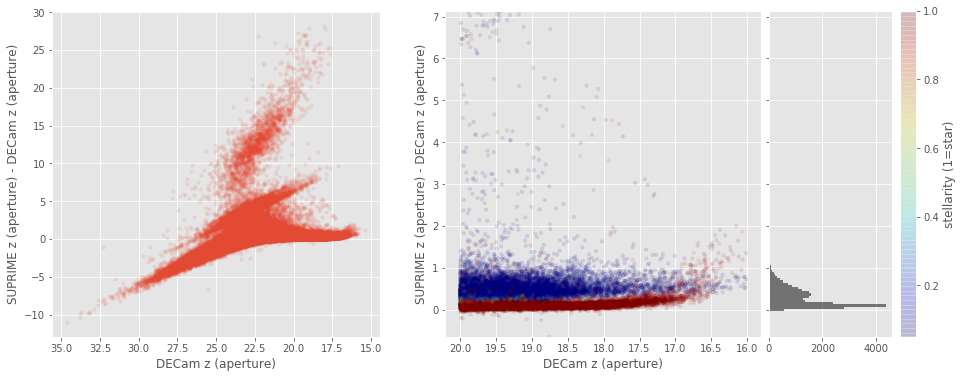

SUPRIME y (aperture) - GPC1 y (aperture):
28865


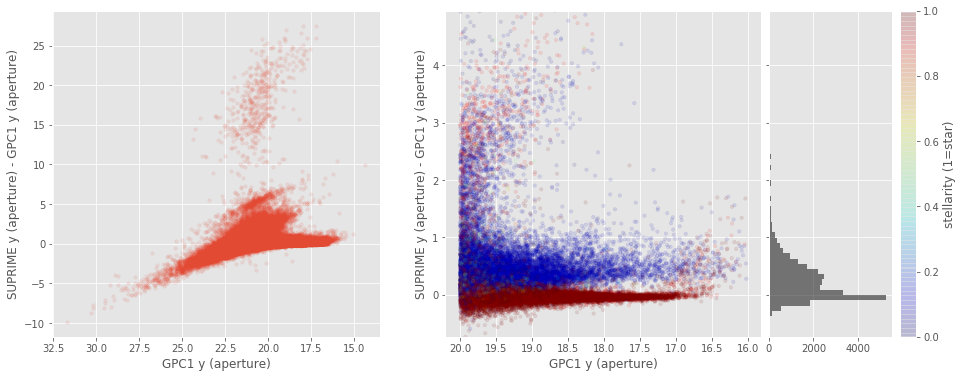

UKIDSS Y (aperture) - GPC1 y (aperture):
22365


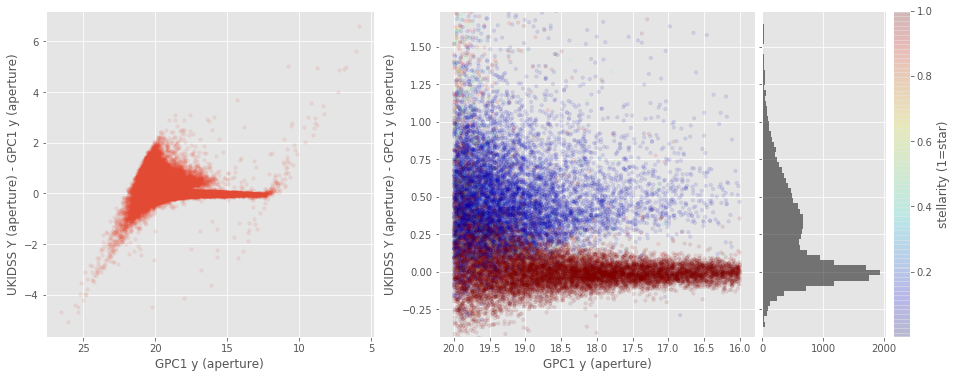

UKIDSS Y (aperture) - SUPRIME y (aperture):
15734


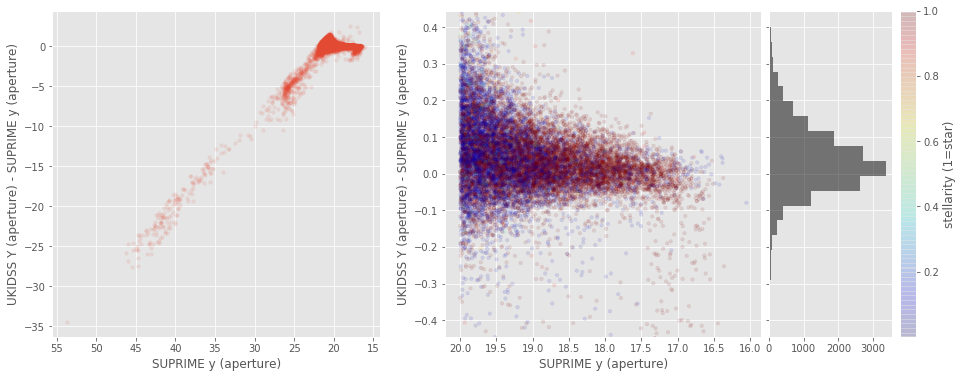

WIRCAM J (aperture) - UKIDSS J (aperture):
5482


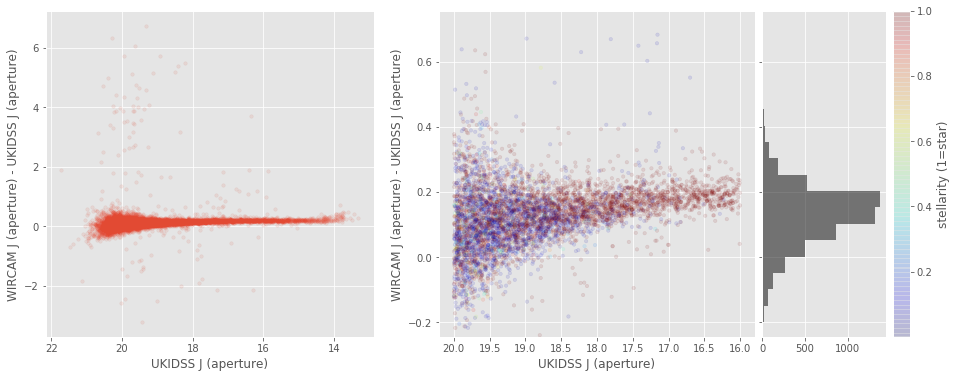

WIRCAM H (aperture) - UKIDSS H (aperture):
7158


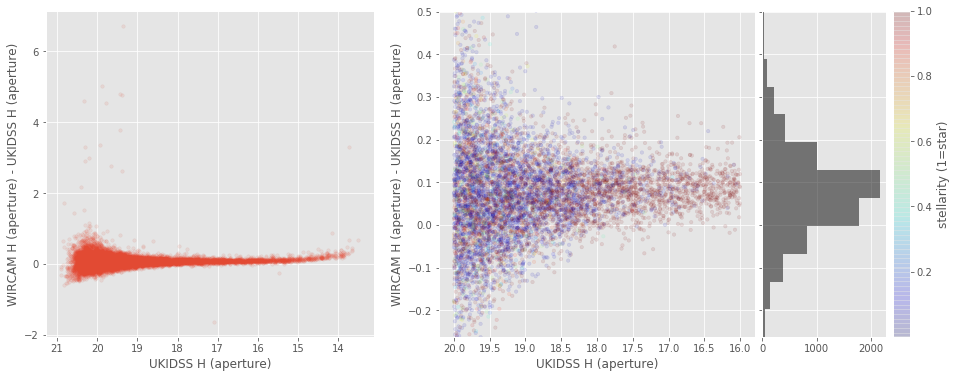

WIRCAM Ks (aperture) - UKIDSS K (aperture):
8806


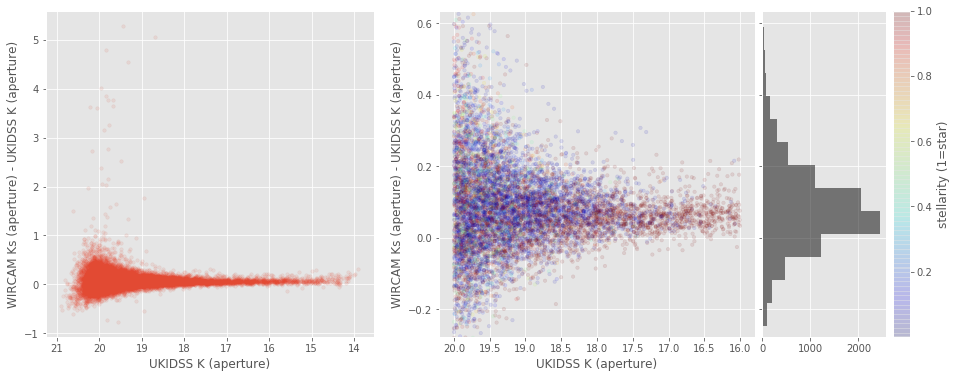

In [35]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if basecol1 == "decam_r" and basecol2 == "kids_r":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)

for j in range(10):
    plt.close()